In [61]:
import matplotlib.pyplot as plt
import pandas as pd

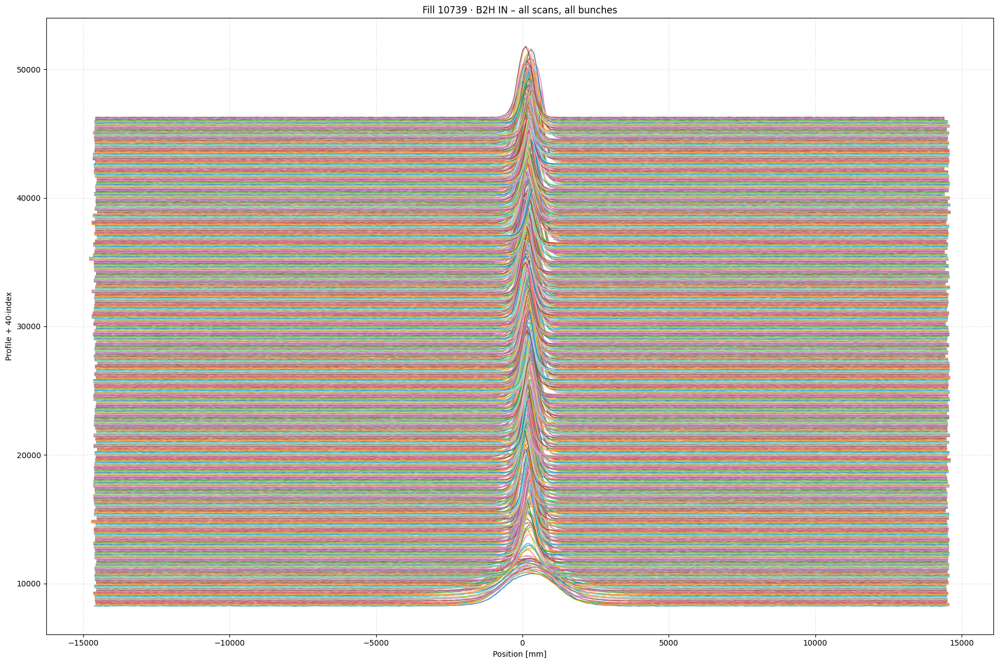

In [62]:
REPDIR = '/eos/project/l/lhc-lumimod/LuminosityFollowUp/2025/ws_analysis'
fno = 10739

# --- load data : it loads a dictionary for the WS data of the fill
wdpkl = pd.read_pickle(f'{REPDIR}/Fill{fno}/Analysis_LHC_WS_fill{fno}.pkl')
wdpkl.keys()
device = 'B2H'
scan = 'IN'

wscan_df = wdpkl[device][scan]
wscan_df.head()
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------------------------------
yoffset  = 40                  # vertical spacing between successive traces
figsize  = (18, 12)            # big canvas for many profiles
lw       = 1.0                 # line width
cmap     = plt.cm.tab20        # re‑use colours every 20 traces
# ---------------------------------------------------

fig, ax = plt.subplots(figsize=figsize)

global_idx = 0   # counts every profile we plot, across scans and bunches

for tstamp, row in wscan_df.iterrows():                           # loop over scans
    bids   = row[f'slots {device} {scan}']                        # bunch IDs
    xpos   = row[f'positions {device} {scan}']                    # list of x‑arrays
    yprof  = row[f'profiles {device} {scan}']                     # list of y‑arrays

    for b_idx, (x, y) in enumerate(zip(xpos, yprof)):             # loop over bunches
        ax.plot(x, y + global_idx*yoffset,
                lw=lw,
                color=cmap(global_idx % cmap.N))
        global_idx += 1

# ----------------------- cosmetics -------------------------------
ax.set_title(f'Fill {fno} · {device} {scan} – all scans, all bunches')
ax.set_xlabel('Position [mm]')
ax.set_ylabel(f'Profile + {yoffset}·index')
ax.grid(True, which='both', ls='--', alpha=0.3)

# Optional: label only the first N traces to avoid legend bloat
# ax.legend(fontsize=8, ncol=5, frameon=False, loc='upper right')

plt.tight_layout()
plt.show()


# not normalized and centered

In [ ]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
import warnings
from scipy.optimize import curve_fit

warnings.filterwarnings("ignore", category=RuntimeWarning)

FILL      = 10739
DEVICE    = "B2H"                # "B1H" or "B2H"
SCAN_KEY  = "IN"                 # WS key in the pickle ("IN" = scans-in)
PHASES    = ["INJPHYS", "RAMP", "FLATTOP", "STABLE"]
N_SCANS   = 3                    # timestamps per phase to plot

# groups per beam
GROUPS_B1 = {"q = 1.0": [21, 501, 751], 
             "q = 1.5": [1251, 1801, 2251]} #, 2251
GROUPS_B2 = {"q = 1.0": [21, 501, 1051], #
             "q = 1.5": [1251, 1801, 2501]} #, 2501
GROUPS    = GROUPS_B1 if DEVICE.startswith("B1") else GROUPS_B2
NEEDED    = set(sum(GROUPS.values(), []))    # all bunch IDs (for INJPHYS gate)

# selection / appearance
MIN_INJPHYS_TIME = pd.Timestamp("2025-06-20 00:45:00", tz="UTC")
LINEWIDTH   = 1.6
ALPHA_BUNCH = 0.25
COLORS      = {"q = 1.0": "tab:green", "q = 1.5": "tab:red"}

# paths
DATADIR   = Path("/eos/project/l/lhc-lumimod/LuminosityFollowUp/md_data/MD15363")
REPDIR    = Path("/eos/project/l/lhc-lumimod/LuminosityFollowUp/2025/ws_analysis")
# ===========================================================


# ----------------------- q-Gaussian ------------------------
def q_gauss(x, A, mu, beta, q):
    """
    Heavy-tailed Tsallis q-Gaussian for 1 < q < 3:
        f(x) = A * [1 + (q-1)*beta*(x-mu)^2]^(-1/(q-1))
    Gaussian limit as q->1: A * exp(-beta*(x-mu)^2)
    """
    x = np.asarray(x, dtype=float)
    z = 1.0 + (q - 1.0) * beta * (x - mu)**2
    z = np.where(z > 1e-14, z, 1e-14)  # prevent tiny/negative
    return A * z ** (-1.0 / (q - 1.0))


# ---------------------- utilities --------------------------
def find_col(cols, prefix, tag):
    pat = re.compile(rf"^{prefix}\s*{re.escape(tag)}$", re.I)
    for c in cols:
        if pat.match(re.sub(r"\s+", " ", c)):
            return c
    raise KeyError(f"Column not found: '{prefix} {tag}'")

def pedestal_subtract(y, frac=0.10):
    ped = np.quantile(y, frac)
    y0  = y - ped
    y0[y0 < 0] = 0
    return y0

def centre_profile(x, y):
    s = y.sum()
    if s <= 0:
        return x, y, np.nan
    mu = (x * y).sum() / s
    return x - mu, y, mu


# ---------------------- energy & scaling --------------------
# Proton rest mass [GeV]
M0_GEV = 0.938272081

def gamma_from_energy(E_GeV: float) -> float:
    """Relativistic gamma for protons from kinetic energy in GeV."""
    return 1.0 + (E_GeV / M0_GEV)

# Reference fit half-window at injection (±ref_win in µm)
REF_WIN_UM = 5000.0
GAMMA_INJ  = gamma_from_energy(450.0)

def piecewise_energy_from_phase(ts: pd.Timestamp,
                                phase_windows: dict,
                                E_inj_GeV: float = 450.0,
                                E_flat_GeV: float = 6800.0) -> float:
    """
    Simple energy model from phase windows:
      INJPHYS             → E_inj_GeV
      RAMP                → linear from E_inj_GeV to E_flat_GeV
      FLATTOP or STABLE   → E_flat_GeV
    """
    phase_of_ts = None
    for ph, win in phase_windows.items():
        if win["start"] <= ts <= win["end"]:
            phase_of_ts = ph
            break
    if phase_of_ts is None:
        return E_inj_GeV
    if phase_of_ts == "INJPHYS":
        return E_inj_GeV
    if phase_of_ts in ("FLATTOP", "STABLE"):
        return E_flat_GeV
    if phase_of_ts == "RAMP":
        t0, t1 = phase_windows["RAMP"]["start"], phase_windows["RAMP"]["end"]
        if t1 <= t0:
            return E_inj_GeV
        alpha = (ts - t0) / (t1 - t0)   # in [0,1]
        return (1 - alpha) * E_inj_GeV + alpha * E_flat_GeV
    return E_inj_GeV

def fit_window_um(ts: pd.Timestamp,
                  phase_windows: dict,
                  ref_win_um: float = REF_WIN_UM,
                  gamma_inj: float = GAMMA_INJ,
                  beta_ratio: float = 1.0,
                  min_win_um: float = 2500.0,
                  max_win_um: float = 30000.0) -> float:
    """
    Return Δx(ts) (µm) so the fit window is |x| ≤ Δx(ts),
    scaled as ref_win * sqrt(gamma_inj/gamma(ts)) * sqrt(beta_ratio).
    If you know β_WS per phase, pass beta_ratio = β_WS(ts)/β_WS(inj).
    """
    E = piecewise_energy_from_phase(ts, phase_windows)
    g = gamma_from_energy(E)
    scale = np.sqrt(gamma_inj / max(g, 1.0))
    width = ref_win_um * scale * np.sqrt(max(beta_ratio, 1e-6))
    return float(np.clip(width, min_win_um, max_win_um))


# ---------------------- load WS scans ----------------------
ws_pkl   = REPDIR / f"Fill{FILL}" / f"Analysis_LHC_WS_fill{FILL}.pkl"
wsdf     = pd.read_pickle(ws_pkl)[DEVICE][SCAN_KEY].sort_index()
wsdf.index = wsdf.index.tz_localize("UTC")

base_tag = f"{DEVICE} {SCAN_KEY}"
pos_c, prof_c, slot_c = (find_col(wsdf.columns, k, base_tag)
                         for k in ("positions", "profiles", "slots"))

print(f"Loaded WS table for {DEVICE} {SCAN_KEY}: {len(wsdf)} scans")


# ---------------------- phase windows (MD) -----------------
def first_interval(bmode):
    folder = DATADIR / f"HX:FILLN={FILL}" / f"HX:BMODE={bmode}"
    t0 = t1 = None
    for pq in folder.rglob("*.parquet"):
        try:
            df  = pd.read_parquet(pq)
            idx = pd.to_datetime(df.index, utc=True, errors="coerce").dropna()
            if idx.empty:
                continue
            lo, hi = idx.min(), idx.max()
            t0 = lo if t0 is None else min(t0, lo)
            t1 = hi if t1 is None else max(t1, hi)
        except Exception:
            continue
    return None if t0 is None else pd.Series({"start": t0, "end": t1})

phase_windows = {ph: first_interval(ph) for ph in PHASES}
phase_windows = {ph: w for ph, w in phase_windows.items() if w is not None}


# ---------------------- choose scans per phase --------------
def pick_scans(window, require_all=False, min_time=None, n=N_SCANS):
    scans = wsdf.loc[window["start"]: window["end"]]
    if min_time is not None:
        scans = scans[scans.index >= min_time]
    if require_all:
        scans = scans[scans[slot_c].apply(lambda s: set(map(int, s)).issuperset(NEEDED))]
    if scans.empty:
        return []
    idxs = np.round(np.linspace(0, len(scans) - 1, n)).astype(int)
    return [scans.index[i] for i in idxs]

phase_scans = {}
for ph, win in phase_windows.items():
    req_all = (ph == "INJPHYS")
    min_t   = MIN_INJPHYS_TIME if ph == "INJPHYS" else None
    stamps  = pick_scans(win, require_all=req_all, min_time=min_t, n=N_SCANS)
    if stamps:
        phase_scans[ph] = stamps


# --------------- fit & overlay for each timestamp ----------
def fit_q_gaussian_to_group(row, bunch_ids, color, ax, label, ts_for_window, beta_ratio=1.0):
    """
    • plot faint individual bunch traces (ped-subtracted & centered),
    • plot the group mean (solid),
    • fit the q-Gaussian on an energy-scaled window |x| ≤ Δx(ts), overlay dashed.
    Returns (q, beta, mu, A, win_um) or None if fit fails.
    """
    slots = list(map(int, row[slot_c]))
    xall  = row[pos_c]
    yall  = row[prof_c]

    xs = []
    ys = []
    for b in bunch_ids:
        if b not in slots:
            continue
        j  = slots.index(b)
        xr = np.asarray(xall[j], dtype=float)
        yr = pedestal_subtract(np.asarray(yall[j], dtype=float))
        xc, yc, _ = centre_profile(xr, yr)
        o = np.argsort(xc)
        xc, yc = xc[o], yc[o]
        xs.append(xc)
        ys.append(yc)
        ax.plot(xc, yc, color=color, alpha=ALPHA_BUNCH, lw=0.8)  # raw bunch

    if not xs:
        return None

    # align on the first bunch grid
    x_ref = xs[0]
    Y = [np.interp(x_ref, xi, yi, left=0, right=0) for xi, yi in zip(xs, ys)]
    y_mean = np.mean(np.vstack(Y), axis=0)

    # draw group mean
    ax.plot(x_ref, y_mean, color=color, lw=LINEWIDTH, label=label)

    # --------- energy-scaled fit window ----------
    win_um = fit_window_um(ts_for_window, phase_windows, beta_ratio=beta_ratio)
    msk    = np.abs(x_ref) <= win_um
    if not np.any(msk):
        msk = slice(None)

    # --------- robust initial guesses ----------
    A0   = float(y_mean[msk].max())
    mu0  = 0.0
    s    = float(y_mean[msk].sum())
    sig0 = (np.sqrt(np.sum((x_ref[msk] - mu0)**2 * y_mean[msk]) / s)
            if s > 0 else max(x_ref.ptp()/10, 1000.0))
    beta0 = 1.0 / (2.0 * max(sig0, 1.0)**2)   # Gaussian limit mapping
    q0    = 1.10
    p0    = (A0, mu0, beta0, q0)
    bounds= ([0.0, -5e3, 1e-12, 1.01], [np.inf, 5e3, np.inf, 2.5])

    try:
        popt, _ = curve_fit(q_gauss,
                            x_ref[msk], y_mean[msk],
                            p0=p0, bounds=bounds, maxfev=20000)
        A, mu, beta, q = popt
        xfit = np.linspace(-win_um, win_um, 1200)
        ax.plot(xfit, q_gauss(xfit, *popt), color=color, ls="--", lw=1.4,
                label=f"{label} fit (q={q:.3f})")
        return q, beta, mu, A, win_um
    except Exception:
        return None


# ---------------------- run plots for all scans --------------
for ph, stamps in phase_scans.items():
    for i, ts in enumerate(stamps, 1):
        row = wsdf.loc[ts]

        fig, ax = plt.subplots(figsize=(10, 6))
        results = {}
        for lbl, bunch_ids in GROUPS.items():
            out = fit_q_gaussian_to_group(row, bunch_ids, COLORS[lbl], ax, lbl,
                                          ts_for_window=ts,
                                          beta_ratio=1.0)   # set β-ratio here if known per phase
            results[lbl] = out

        # annotate chosen window half-width for info
        try:
            win_um = fit_window_um(ts, phase_windows)
            ax.axvline(+win_um, color="grey", lw=0.8, ls=":")
            ax.axvline(-win_um, color="grey", lw=0.8, ls=":")
            ax.text(0.02, 0.95, f"fit window ±{int(win_um)} µm (γ-scaled)",
                    transform=ax.transAxes, ha="left", va="top", fontsize=9)
        except Exception:
            pass

        ax.set_title(
            f"Fill {FILL} – {DEVICE} {SCAN_KEY} | {ph} | Scan {i}/{len(stamps)}\n"
            f"{ts.strftime('%Y-%m-%d %H:%M:%S UTC')}"
        )
        ax.set_xlabel("Wire position [µm] (centered)")
        ax.set_ylabel("Counts (pedestal-subtracted)")
        ax.grid(ls=":", alpha=0.4)
        ax.legend(ncol=2, frameon=False)
        plt.tight_layout()
        plt.show()

Loaded WS table for B2H IN: 138 scans


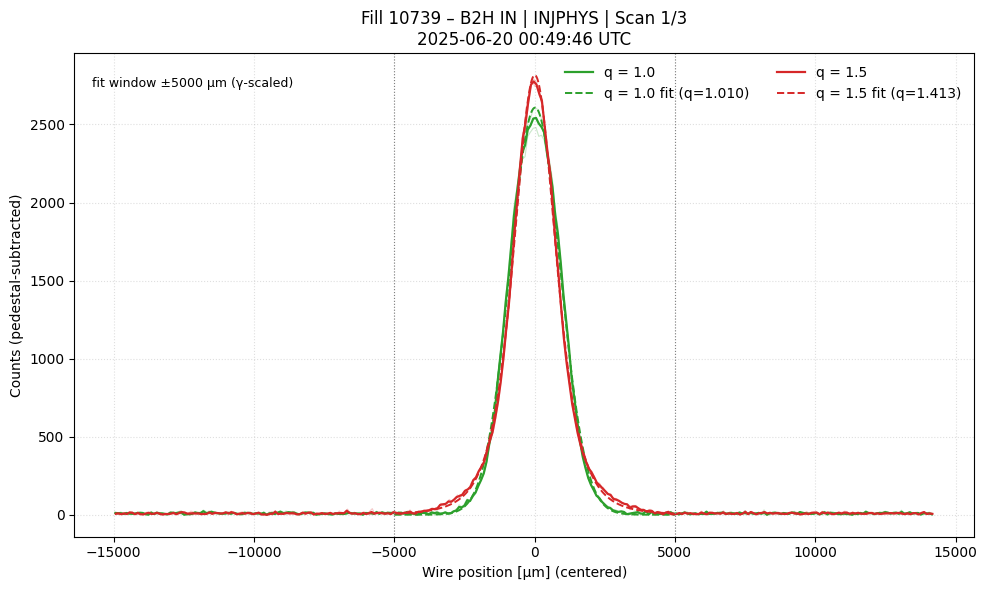

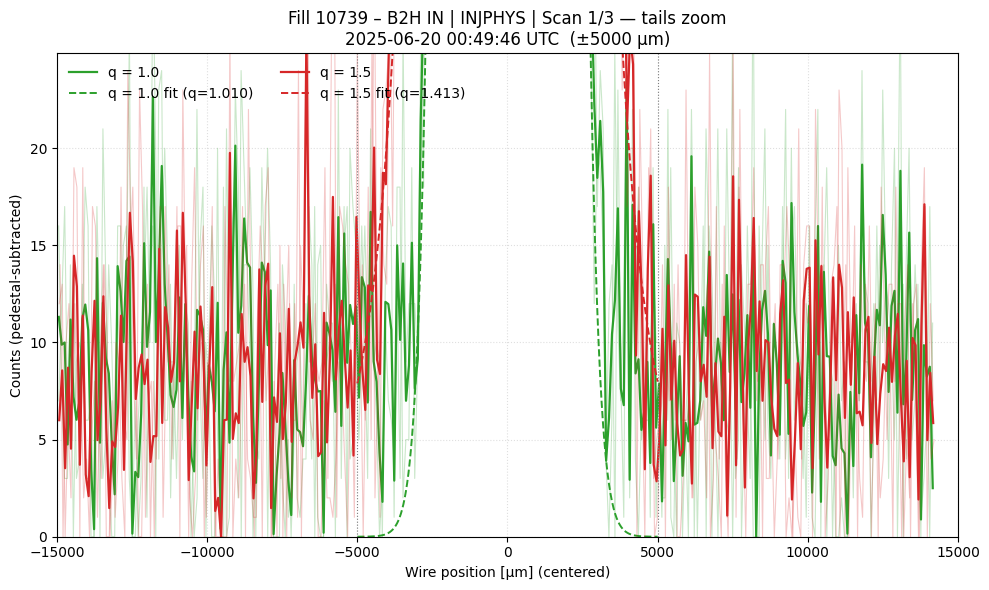

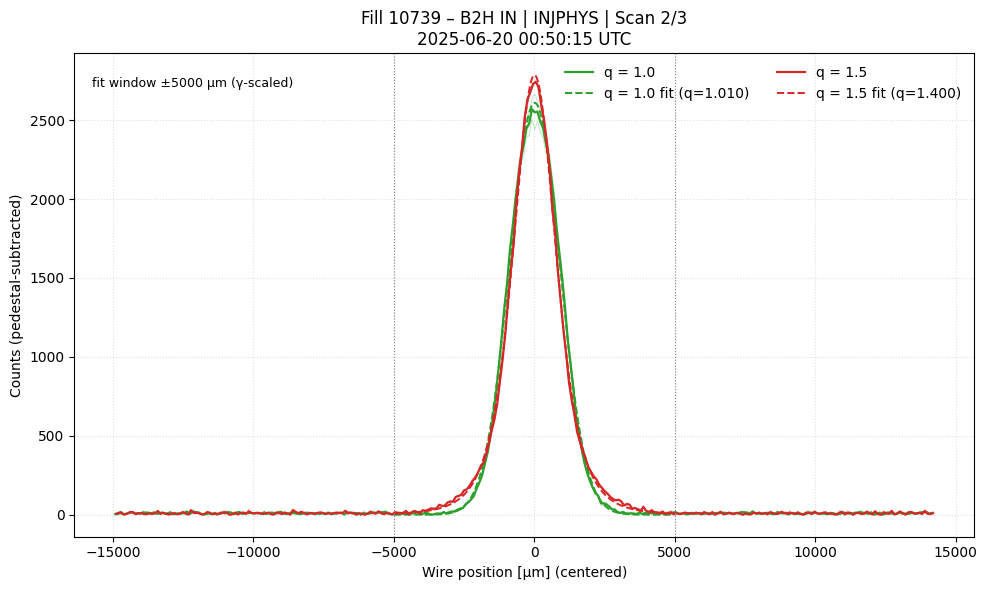

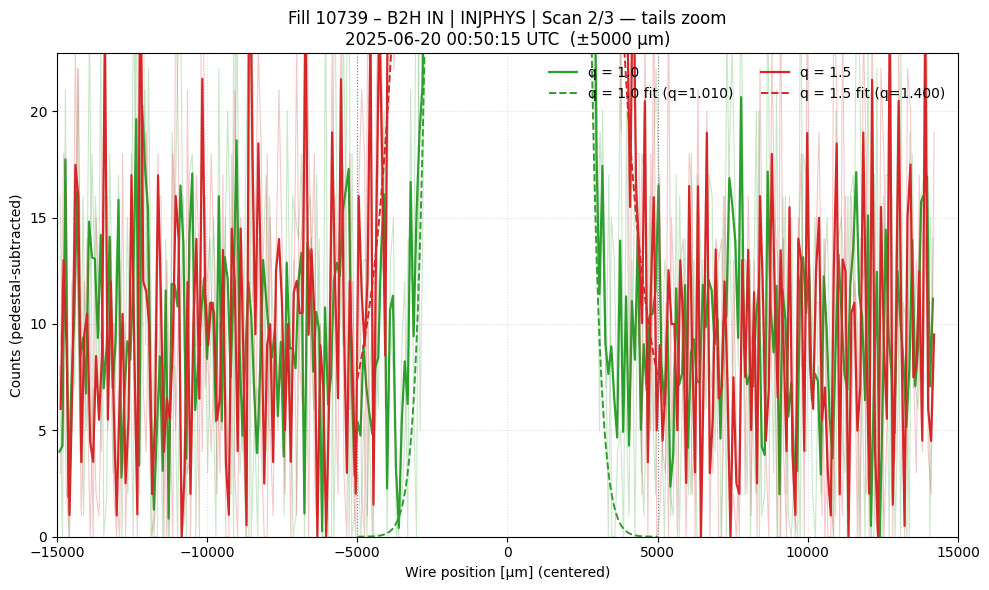

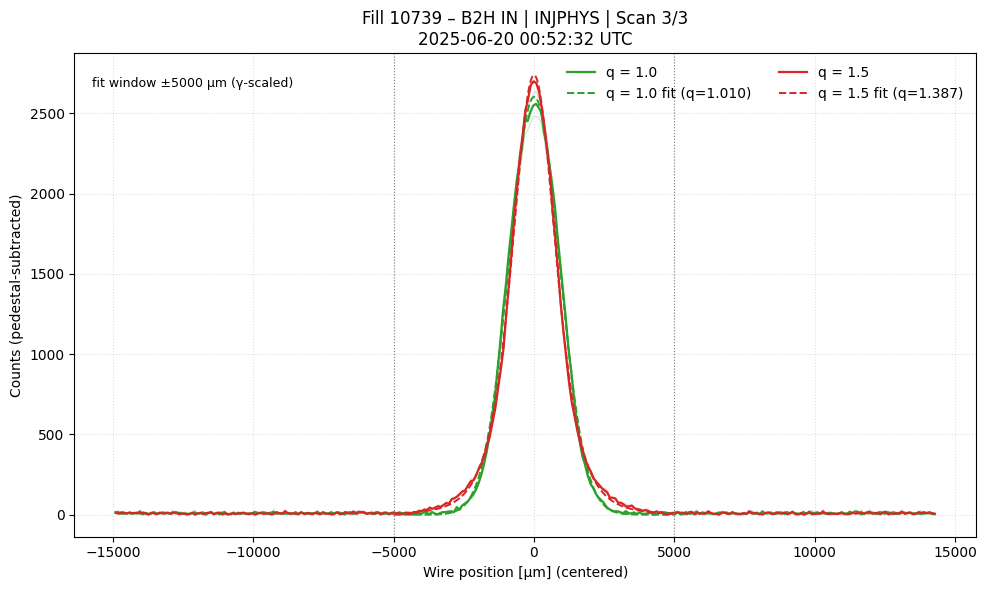

...

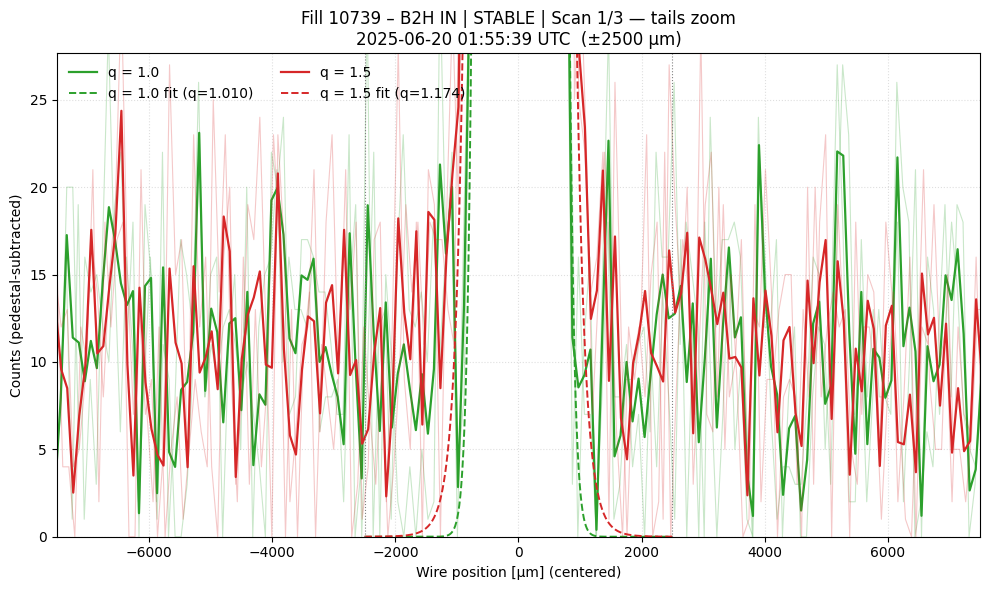

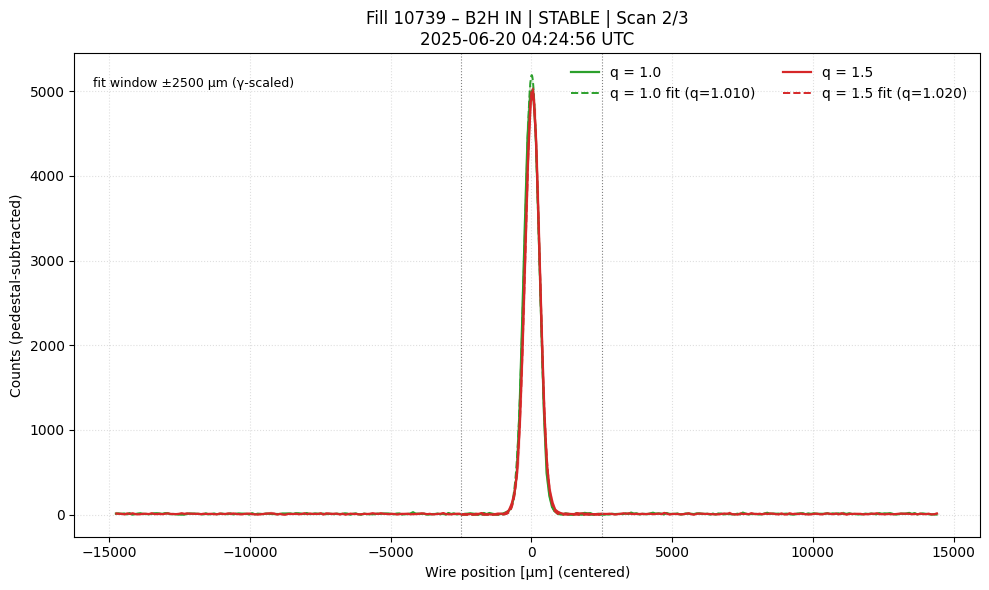

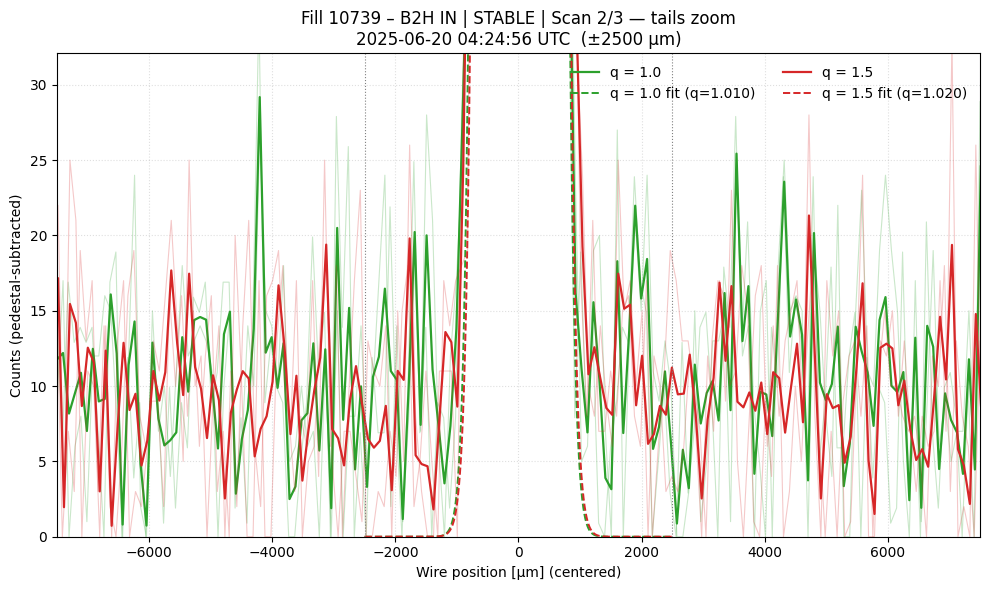

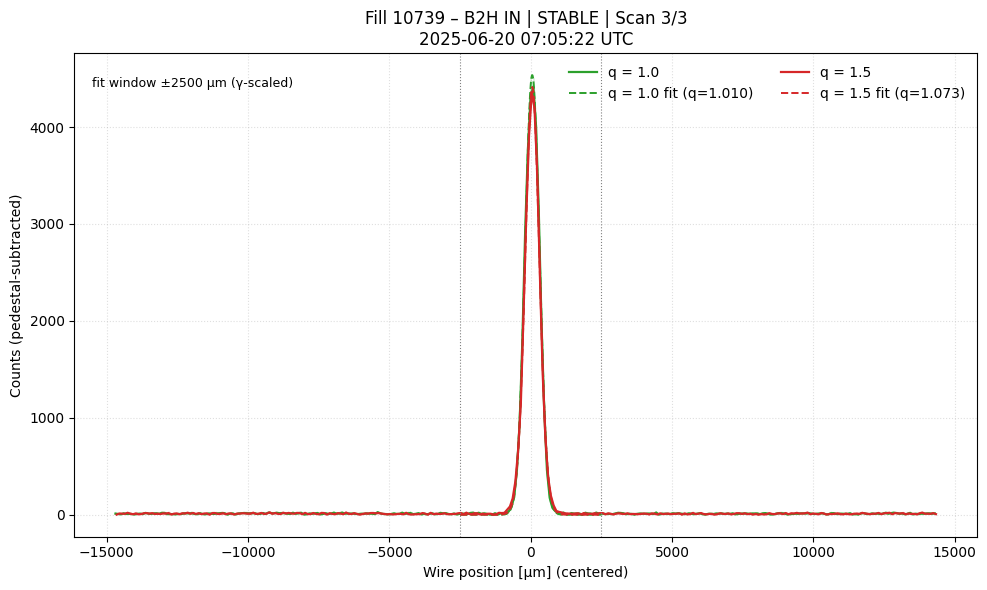

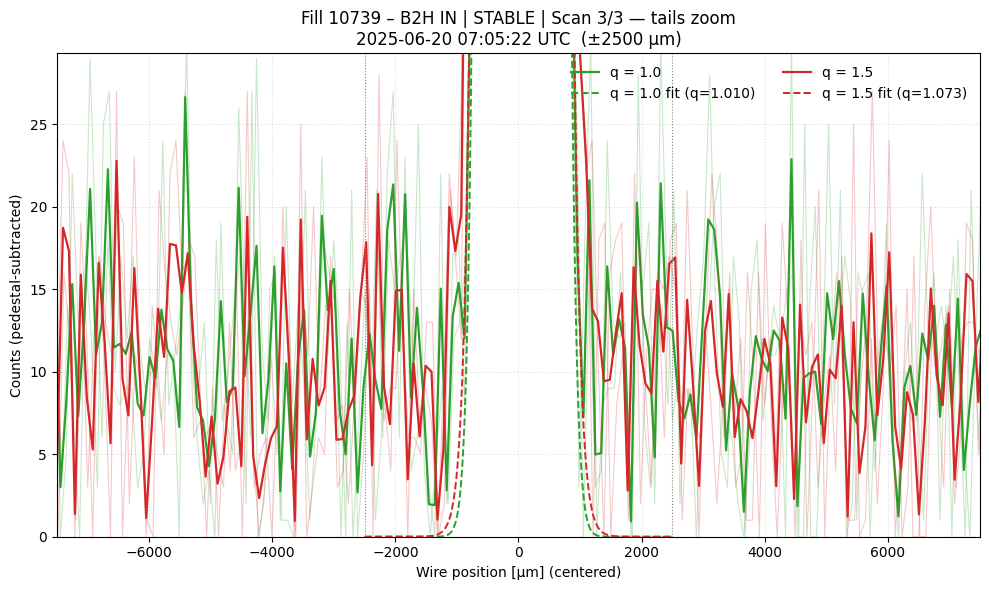

In [ ]:
for ph, stamps in phase_scans.items():
    for i, ts in enumerate(stamps, 1):
        row = wsdf.loc[ts]

        # -------- original full‐view figure (unchanged) --------
        fig, ax = plt.subplots(figsize=(10, 6))
        for lbl, bunch_ids in GROUPS.items():
            fit_q_gaussian_to_group(
                row, bunch_ids, COLORS[lbl], ax, lbl,
                ts_for_window=ts, beta_ratio=1.0
            )
        win_um = fit_window_um(ts, phase_windows)
        ax.axvline(+win_um, color="grey", lw=0.8, ls=":")
        ax.axvline(-win_um, color="grey", lw=0.8, ls=":")
        ax.text(
            0.02, 0.95,
            f"fit window ±{int(win_um)} µm (γ-scaled)",
            transform=ax.transAxes, ha="left", va="top", fontsize=9
        )
        ax.set_title(
            f"Fill {FILL} – {DEVICE} {SCAN_KEY} | {ph} | Scan {i}/{len(stamps)}\n"
            f"{ts.strftime('%Y-%m-%d %H:%M:%S UTC')}"
        )
        ax.set_xlabel("Wire position [µm] (centered)")
        ax.set_ylabel("Counts (pedestal-subtracted)")
        ax.grid(ls=":", alpha=0.4)
        ax.legend(ncol=2, frameon=False)
        plt.tight_layout()
        plt.show()

        # -------- single‐panel tails-zoom figure (NEW) --------
        # recompute the group mean on the tails grid to get y_mean
        slots = list(map(int, row[slot_c]))
        xall, yall = row[pos_c], row[prof_c]
        # pick one group to extract x_ref, y_mean (they all share windows)
        # here we reuse the last LABEL loop, but you can pick either group
        x_ref, y_mean = None, None
        for lbl, bunch_ids in GROUPS.items():
            # same logic as in fit_q_gaussian_to_group but just for average
            xs, ys = [], []
            for b in bunch_ids:
                if b not in slots: continue
                j = slots.index(b)
                xr = np.asarray(xall[j], float)
                yr = pedestal_subtract(np.asarray(yall[j], float))
                xc, yc, _ = centre_profile(xr, yr)
                o = np.argsort(xc)
                xs.append(xc[o]); ys.append(yc[o])
            if xs:
                x_ref = xs[0]
                Y     = [np.interp(x_ref, xi, yi, left=0, right=0)
                         for xi, yi in zip(xs, ys)]
                y_mean = np.mean(np.vstack(Y), axis=0)
                break
        if x_ref is None:
            continue

        # now plot zoom
        figz, axz = plt.subplots(figsize=(10, 6))
        for lbl, bunch_ids in GROUPS.items():
            fit_q_gaussian_to_group(
                row, bunch_ids, COLORS[lbl], axz, lbl,
                ts_for_window=ts, beta_ratio=1.0
            )
        # restrict to ±3·win_um
        axz.set_xlim(-3*win_um, +3*win_um)
        # compute new y‐limit from the tails region (>±win_um)
        mask_tails = np.abs(x_ref) >= win_um
        if np.any(mask_tails):
            tail_max = np.nanmax(y_mean[mask_tails])
            axz.set_ylim(0, tail_max*1.1)

        axz.axvline(+win_um, color="grey", lw=0.8, ls=":")
        axz.axvline(-win_um, color="grey", lw=0.8, ls=":")
        axz.set_title(
            f"Fill {FILL} – {DEVICE} {SCAN_KEY} | {ph} | Scan {i}/{len(stamps)} — tails zoom\n"
            f"{ts.strftime('%Y-%m-%d %H:%M:%S UTC')}  (±{int(win_um)} µm)"
        )
        axz.set_xlabel("Wire position [µm] (centered)")
        axz.set_ylabel("Counts (pedestal-subtracted)")
        axz.grid(ls=":", alpha=0.4)
        axz.legend(ncol=2, frameon=False)
        plt.tight_layout()
        plt.show()


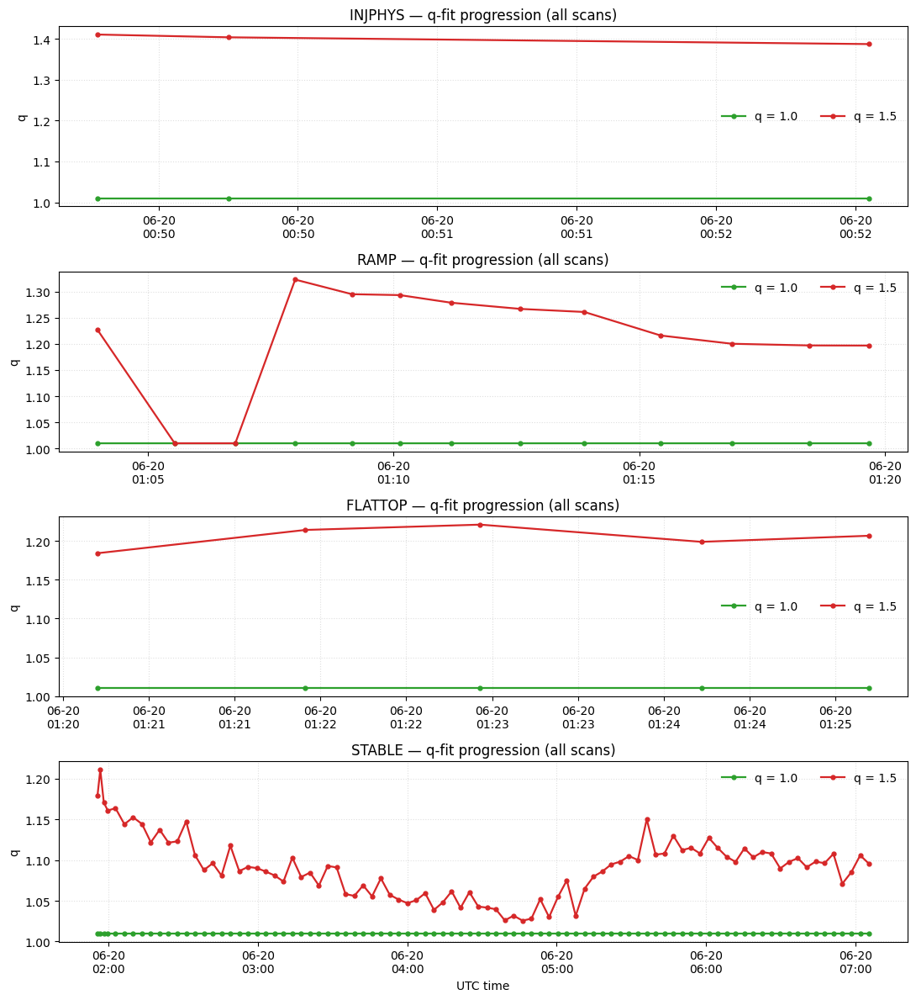

In [60]:
# =============== helper: q-fit for one row/group (no plotting) ===============
def qfit_for_group(row, bunch_ids, ts_for_window, beta_ratio=1.0):
    """
    Returns q (np.nan on failure) for the mean of 'bunch_ids' at timestamp ts_for_window,
    using pedestal-subtracted, centroid-centered traces and an energy-scaled fit window.
    """
    try:
        slots = list(map(int, row[slot_c]))
    except Exception:
        slots = list(row[slot_c])  # fallback if already int
    xall  = row[pos_c]
    yall  = row[prof_c]

    xs, ys = [], []
    for b in bunch_ids:
        if b not in slots:
            continue
        j  = slots.index(b)
        xr = np.asarray(xall[j], dtype=float)
        yr = pedestal_subtract(np.asarray(yall[j], dtype=float))
        xc, yc, _ = centre_profile(xr, yr)
        o = np.argsort(xc)
        xs.append(xc[o]); ys.append(yc[o])

    if not xs:
        return np.nan

    # align on first grid; average
    x_ref = xs[0]
    Y = [np.interp(x_ref, xi, yi, left=0, right=0) for xi, yi in zip(xs, ys)]
    y_mean = np.mean(np.vstack(Y), axis=0)

    # energy-scaled fit window
    win_um = fit_window_um(ts_for_window, phase_windows, beta_ratio=beta_ratio)
    msk    = np.abs(x_ref) <= win_um
    if not np.any(msk):
        # fallback: use all points if mask is empty
        msk = slice(None)

    # initial guesses & bounds
    A0   = float(y_mean[msk].max())
    mu0  = 0.0
    s    = float(y_mean[msk].sum())
    sig0 = (np.sqrt(np.sum((x_ref[msk] - mu0)**2 * y_mean[msk]) / s)
            if s > 0 else max(x_ref.ptp()/10, 1000.0))
    beta0 = 1.0 / (2.0 * max(sig0, 1.0)**2)
    q0    = 1.10
    p0    = (A0, mu0, beta0, q0)
    bounds= ([0.0, -5e3, 1e-12, 1.01], [np.inf, 5e3, np.inf, 2.5])

    try:
        popt, _ = curve_fit(q_gauss, x_ref[msk], y_mean[msk],
                            p0=p0, bounds=bounds, maxfev=20000)
        q = float(popt[3])
    except Exception:
        q = np.nan
    return q


# =============== build full time series of q for each phase ===============
records = []
for phase, win in phase_windows.items():
    # select all scans inside the phase window
    scans = wsdf.loc[win["start"]:win["end"]].copy()

    # Injection gating: after MIN_INJPHYS_TIME and ensure all required bunches
    if phase.upper() in ("INJPHYS", "IN"):
        scans = scans[scans.index >= MIN_INJPHYS_TIME]
        scans = scans[scans[slot_c].apply(lambda s: set(map(int, s)).issuperset(NEEDED))]

    if scans.empty:
        continue

    for ts, row in scans.iterrows():
        for label, blist in GROUPS.items():
            qv = qfit_for_group(row, blist, ts_for_window=ts, beta_ratio=1.0)
            records.append({"phase": phase, "group": label, "ts": ts, "q_fit": qv})

q_df = pd.DataFrame.from_records(records)
if q_df.empty:
    print("No q-fit data computed — check gating and inputs.")
else:
    q_df.sort_values("ts", inplace=True)
    q_df.set_index("ts", inplace=True)
    # optional: monotonic index per phase to allow rolling ops later
    # (not needed just to plot progression)


# =============== plot q progression for all scans, per phase ===============
import matplotlib.dates as mdates

if not q_df.empty:
    phases_plot = list(phase_windows.keys())  # preserve discovered order
    fig, axes = plt.subplots(len(phases_plot), 1,
                             figsize=(11, 3.0*len(phases_plot)), sharex=False)

    if len(phases_plot) == 1:
        axes = [axes]

    for ax, phase in zip(axes, phases_plot):
        for label, color in COLORS.items():
            sub = q_df[(q_df["phase"] == phase) & (q_df["group"] == label)]
            if sub.empty:
                continue
            ax.plot(sub.index, sub["q_fit"], marker='o', lw=1.6, ms=3.5,
                    color=color, label=label)
        ax.set_title(f"{phase} — q-fit progression (all scans)")
        ax.set_ylabel("q")
        ax.grid(ls=":", alpha=0.4)
        ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d\n%H:%M"))
        ax.legend(frameon=False, ncol=2)

    axes[-1].set_xlabel("UTC time")
    plt.tight_layout()
    plt.show()


In [49]:
# pick the suspicious time (visually from your plot)
t0 = pd.Timestamp("2025-06-20 05:30:00", tz="UTC")  # adjust a bit if needed
sl = slice(t0 - pd.Timedelta("5min"), t0 + pd.Timedelta("5min"))

stable_win = phase_windows["STABLE"]
stable_scans = wsdf.loc[stable_win["start"]: stable_win["end"]].loc[sl].copy()

def present_bunches(row, bunch_ids):
    try:
        slots = set(map(int, row[slot_c]))
    except Exception:
        slots = set(row[slot_c])
    return sorted([b for b in bunch_ids if b in slots])

print("Scans in ±5 min window:")
for ts, row in stable_scans.iterrows():
    print(ts.strftime("%H:%M:%S"), 
          "q1:", present_bunches(row, GROUPS["q = 1.0"]),
          "q1_count:", len(present_bunches(row, GROUPS["q = 1.0"])))

# Also print the fit window used and some seeds
for ts, row in stable_scans.iterrows():
    win_um = fit_window_um(ts, phase_windows, beta_ratio=1.0)
    # crude amplitude/width proxies for the group (means the first bunch if present)
    slots = list(map(int, row[slot_c]))
    if GROUPS["q = 1.0"][0] in slots:
        j = slots.index(GROUPS["q = 1.0"][0])
        x = np.asarray(row[pos_c][j], float); y = np.asarray(row[prof_c][j], float)
        y = y - np.quantile(y, 0.10); y[y<0]=0
        x = x - (x*y).sum()/max(y.sum(),1)
        s = y.sum(); sig0 = np.sqrt(np.sum((x**2)*y)/s) if s>0 else np.nan
        A0 = y.max()
    else:
        A0 = np.nan; sig0=np.nan
    print(ts.strftime("%H:%M:%S"), f"Δx_fit={win_um:.0f} µm, A0≈{A0:.0f}, σ0≈{sig0:.0f}")


Scans in ±5 min window:
05:25:28 q1: [21, 501] q1_count: 2
05:29:01 q1: [21, 501] q1_count: 2
05:32:34 q1: [21, 501] q1_count: 2
05:25:28 Δx_fit=2500 µm, A0≈4910, σ0≈2323
05:29:01 Δx_fit=2500 µm, A0≈4919, σ0≈2383
05:32:34 Δx_fit=2500 µm, A0≈4855, σ0≈2342


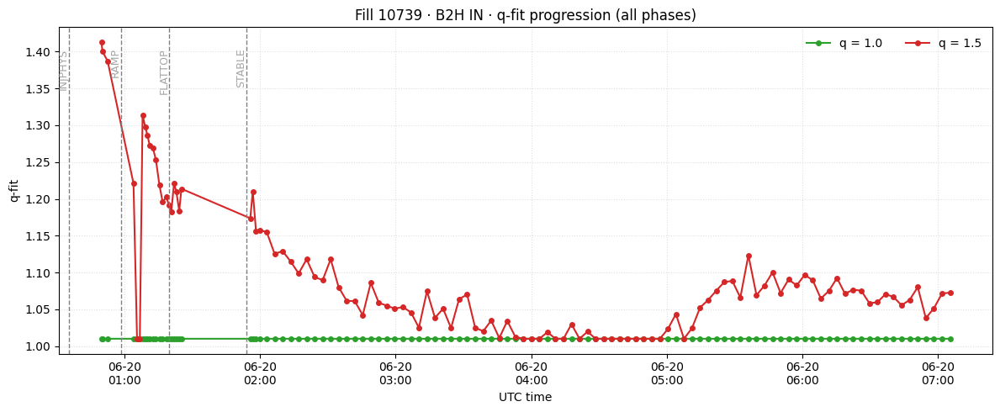

In [50]:
import matplotlib.dates as mdates

# Make sure you already have `phase_windows` (with start/end) and `q_df` built as before.

# --- start combined plot ---
fig, ax = plt.subplots(figsize=(12, 5))

# Plot both q‐groups over the full fill
for label, color in COLORS.items():
    sub = q_df[q_df["group"] == label]
    ax.plot(sub.index, sub["q_fit"], marker='o', ms=4, lw=1.5,
            color=color, label=label)

# Add vertical lines & phase labels
for phase, win in phase_windows.items():
    t0 = win["start"]
    ax.axvline(t0, color='grey', ls='--', lw=1)
    # position the text just above the top of the y-range
    ymax = ax.get_ylim()[1]
    ax.text(t0, ymax*0.98, phase,
            rotation=90, va='top', ha='right', fontsize=9,
            color='grey', alpha=0.7)

ax.set_title(f"Fill {FILL} · {DEVICE} {SCAN_KEY} · q‐fit progression (all phases)")
ax.set_ylabel("q‐fit")
ax.set_xlabel("UTC time")
ax.grid(ls=":", alpha=0.4)

ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d\n%H:%M"))
ax.legend(frameon=False, ncol=2, loc="upper right")

plt.tight_layout()
plt.show()


In [51]:
import pandas as pd

# — assume you already have —
#   q_df           : DataFrame indexed by ts, with columns ["phase","group","q_fit"]
#   phase_windows  : dict of {phase: {"start":…, "end":…}}
#   piecewise_energy_from_phase(ts, phase_windows) function

# 1) restrict to FLATTOP:
ft = q_df[q_df["phase"] == "FLATTOP"]

# 2) for each q-group find the timestamp of minimum q_fit
records = []
for grp in ft["group"].unique():
    sub = ft[ft["group"] == grp]
    if sub.empty:
        continue
    ts_min = sub["q_fit"].idxmin()
    q_min  = sub.loc[ts_min, "q_fit"]
    E_GeV  = piecewise_energy_from_phase(ts_min, phase_windows)
    records.append({
        "group":        grp,
        "ts_of_drop":   ts_min,
        "q_fit_min":    q_min,
        "energy_GeV":   E_GeV
    })

res = pd.DataFrame(records).set_index("group")
print(res)


                                 ts_of_drop  q_fit_min  energy_GeV
group                                                             
q = 1.0 2025-06-20 01:21:54.766920225+00:00   1.010000      6800.0
q = 1.5 2025-06-20 01:20:42.123318225+00:00   1.182566      6800.0


/tmp/kpervain/ipykernel_450030/1004350382.py:193: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ymn = y_mean/np.trapz(y_mean, x_ref)


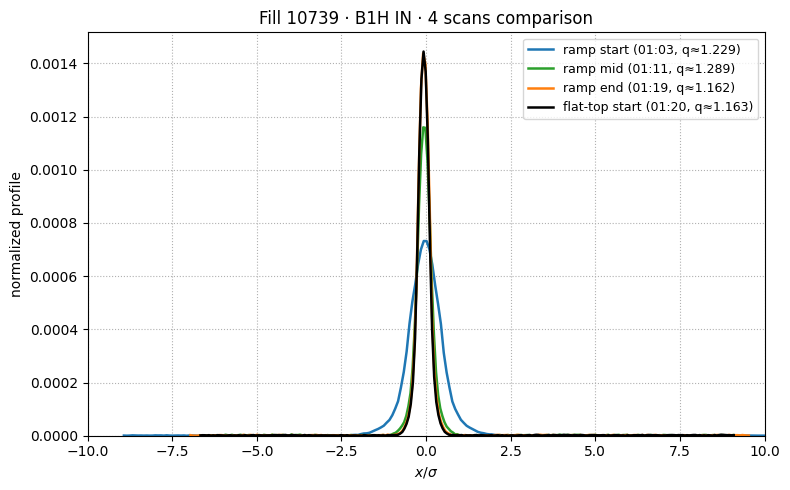

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
from pathlib import Path
from scipy.optimize import curve_fit
import warnings

warnings.filterwarnings("ignore", category=RuntimeWarning)

# ====================== configuration ======================
FILL      = 10739
DEVICE    = "B1H"                 
SCAN_KEY  = "IN"                  
PHASES    = ["INJPHYS", "RAMP", "FLATTOP", "STABLE"]
N_SCANS   = 3                    

GROUPS_B1 = {"q = 1.0": [21, 501, 751], 
             "q = 1.5": [1251, 1801, 2251]} #, 2251
GROUPS_B2 = {"q = 1.0": [21, 501, 1051], #
             "q = 1.5": [1251, 1801, 2501]} #, 2501
GROUPS    = GROUPS_B1 if DEVICE.startswith("B1") else GROUPS_B2
NEEDED    = set(sum(GROUPS.values(), []))

MIN_INJPHYS_TIME = pd.Timestamp("2025-06-20 00:45:00", tz="UTC")
LINEWIDTH   = 1.6
ALPHA_BUNCH = 0.25
COLORS      = {"q = 1.0": "tab:green", "q = 1.5": "tab:red"}

DATADIR = Path("/eos/project/l/lhc-lumimod/LuminosityFollowUp/md_data/MD15363")
REPDIR  = Path("/eos/project/l/lhc-lumimod/LuminosityFollowUp/2025/ws_analysis")
# ===========================================================


# ---------- helpers ----------
def find_col(cols, prefix, tag):
    pat = re.compile(rf"^{prefix}\s*{re.escape(tag)}$", re.I)
    for c in cols:
        if pat.match(re.sub(r"\s+", " ", c)):
            return c
    raise KeyError(f"Column not found: '{prefix} {tag}'")

def pedestal_subtract(y, frac=0.10):
    ped = np.quantile(y, frac)
    y0  = y - ped
    y0[y0 < 0] = 0
    return y0

def centre_profile(x, y):
    s = y.sum()
    if s <= 0:
        return x, y, np.nan
    mu = (x * y).sum() / s
    return x - mu, y, mu

def q_gauss(x, A, mu, beta, q):
    x = np.asarray(x, float)
    z = 1.0 + (q - 1.0) * beta * (x - mu)**2
    z = np.where(z > 1e-14, z, 1e-14)
    return A * z ** (-1.0 / (q - 1.0))


# ---------- load WS scans ----------
ws_pkl = REPDIR / f"Fill{FILL}" / f"Analysis_LHC_WS_fill{FILL}.pkl"
wsdf   = pd.read_pickle(ws_pkl)[DEVICE][SCAN_KEY].sort_index()
wsdf.index = wsdf.index.tz_localize("UTC")

base_tag = f"{DEVICE} {SCAN_KEY}"
pos_c, prof_c, slot_c = (find_col(wsdf.columns, k, base_tag)
                         for k in ("positions", "profiles", "slots"))


# ---------- determine phase windows ----------
def first_interval(bmode):
    folder = DATADIR / f"HX:FILLN={FILL}" / f"HX:BMODE={bmode}"
    t0 = t1 = None
    for pq in folder.rglob("*.parquet"):
        try:
            idx = pd.to_datetime(pd.read_parquet(pq, columns=[]).index,
                                 utc=True, errors="coerce").dropna()
            if idx.empty: continue
            lo, hi = idx.min(), idx.max()
            t0 = lo if t0 is None else min(t0, lo)
            t1 = hi if t1 is None else max(t1, hi)
        except Exception:
            continue
    return None if t0 is None else pd.Series({"start": t0, "end": t1})

phase_windows = {ph: first_interval(ph) for ph in PHASES}
phase_windows = {ph: w for ph, w in phase_windows.items() if w is not None}


# ---------- pick scans per phase ----------
def pick_scans(window, require_all=False, min_time=None, n=N_SCANS):
    scans = wsdf.loc[window["start"]:window["end"]]
    if min_time is not None:
        scans = scans[scans.index >= min_time]
    if require_all:
        scans = scans[scans[slot_c].apply(lambda s: set(map(int, s)).issuperset(NEEDED))]
    if scans.empty:
        return []
    idxs = np.round(np.linspace(0, len(scans) - 1, n)).astype(int)
    return [scans.index[i] for i in idxs]

phase_scans = {}
for ph, win in phase_windows.items():
    req_all = (ph == "INJPHYS")
    min_t   = MIN_INJPHYS_TIME if ph == "INJPHYS" else None
    stamps  = pick_scans(win, require_all=req_all, min_time=min_t, n=N_SCANS)
    if stamps:
        phase_scans[ph] = stamps


# ---------- q‐fit helper (no plotting) ----------
def qfit_for_group(row, bunch_ids, ts_for_window):
    slots = list(map(int, row[slot_c]))
    xall  = row[pos_c]
    yall  = row[prof_c]

    xs, ys = [], []
    for b in bunch_ids:
        if b not in slots:
            continue
        j  = slots.index(b)
        xr = np.asarray(xall[j], float)
        yr = pedestal_subtract(np.asarray(yall[j], float))
        xc, yc, _ = centre_profile(xr, yr)
        o = np.argsort(xc)
        xs.append(xc[o]); ys.append(yc[o])

    if not xs:
        return np.nan, (None, None)

    x_ref = xs[0]
    Y = [np.interp(x_ref, xi, yi, left=0, right=0) for xi, yi in zip(xs, ys)]
    y_mean = np.mean(np.vstack(Y), axis=0)

    # fit window ±5 mm (fixed here for simplicity)
    msk = np.abs(x_ref) <= 5000.0
    if not np.any(msk):
        msk = slice(None)

    # initial guesses
    A0   = float(y_mean[msk].max())
    mu0  = 0.0
    s    = float(y_mean[msk].sum())
    sig0 = np.sqrt(np.sum((x_ref[msk] - mu0)**2 * y_mean[msk]) / s) if s>0 else 2000
    beta0 = 1.0/(2.0*sig0**2)
    q0    = 1.1
    p0    = (A0, mu0, beta0, q0)
    bounds= ([0,-5e3,1e-12,1.01],[np.inf,5e3,np.inf,2.5])

    try:
        popt, _ = curve_fit(q_gauss,
                            x_ref[msk], y_mean[msk],
                            p0=p0, bounds=bounds, maxfev=20000)
        qval = float(popt[3])
    except Exception:
        qval = np.nan

    return qval, (x_ref, y_mean)


# ---------- choose your four “nominal” times ----------
# e.g. start/mid/end of RAMP, then start of FLATTOP
ramp = phase_scans.get("RAMP", [])
flat = phase_scans.get("FLATTOP", [])
times_nominal = []
if len(ramp)>=3:
    times_nominal += [ramp[0], ramp[1], ramp[2]]
if flat:
    times_nominal.append(flat[0])

labels = ["ramp start", "ramp mid", "ramp end", "flat-top start"]
colors = ["C0","C2","C1","k"]

# ---------- map to nearest actual scan timestamp ----------
times_actual = []
for ts in times_nominal:
    pos = wsdf.index.get_indexer([ts], method="nearest")[0]
    times_actual.append(wsdf.index[pos])

# ---------- single‐plot in σ units ----------
plt.figure(figsize=(8,5))
for ts, lab, c in zip(times_actual, labels, colors):
    row = wsdf.loc[ts]
    qval, (x_ref, y_mean) = qfit_for_group(row, GROUPS["q = 1.5"], ts)
    # compute σ from second moment
    S   = y_mean.sum()
    mu0 = 0.0
    sig = np.sqrt(np.sum((x_ref-mu0)**2 * y_mean)/S) if S>0 else 1.0
    # area-normalize
    ymn = y_mean/np.trapz(y_mean, x_ref)
    plt.plot(x_ref/sig, ymn, color=c, lw=1.8,
             label=f"{lab} ({ts.strftime('%H:%M')}, q≈{qval:.3f})")

plt.xlim(-10,10)
plt.ylim(0,None)
plt.xlabel(r"$x/\sigma$")
plt.ylabel("normalized profile")
plt.title(f"Fill {FILL} · {DEVICE} {SCAN_KEY} · 4 scans comparison")
plt.legend(fontsize=9, loc="upper right")
plt.grid(ls=":")
plt.tight_layout()
plt.show()


Dip at 2025-06-20 01:06:46.763747725+00:00, using nearest scan → 2025-06-20 01:06:45.842750975+00:00


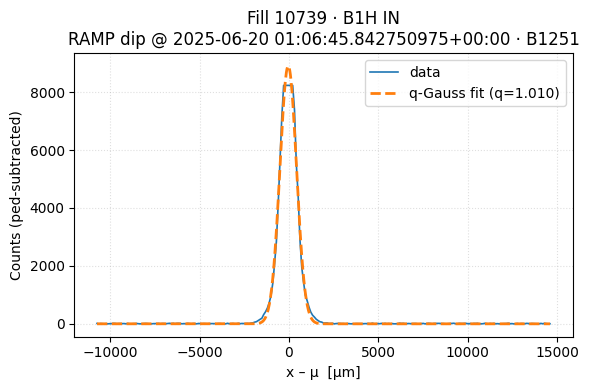

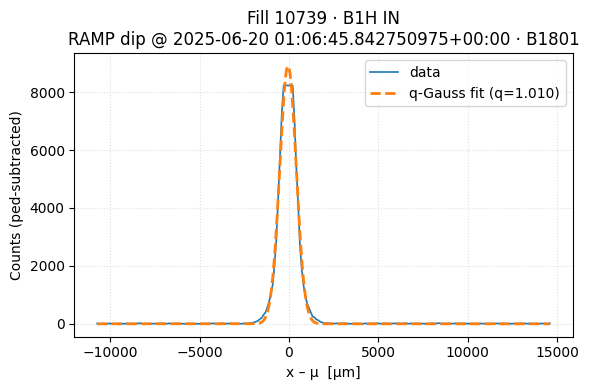

In [53]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
from scipy.optimize import curve_fit

# ── ASSUMED DEFINED IN YOUR SESSION ─────────────────────────────────
#   wsdf   : your wire-scanner DataFrame, indexed by tz-aware timestamps
#   q_df   : your tail-evolution DataFrame, indexed by ts, with cols 
#            ["phase","group","q_fit", …]
#   GROUPS : dict with GROUPS["q = 1.5"] = [1251,1801,2251]
#   find_col, pedestal_subtract, centre_profile, q_gauss  as above.

# ── 1) Find dip timestamp in RAMP, q=1.5 ────────────────────────────
dip_mask = (q_df.phase == "RAMP") & (q_df.group == "q = 1.5")
t_dip    = q_df.loc[dip_mask, "q_fit"].idxmin()

# ── 2) Snap to the nearest WS scan ──────────────────────────────────
pos    = wsdf.index.get_indexer([t_dip], method="nearest")[0]
t_scan = wsdf.index[pos]
row    = wsdf.iloc[pos]

print(f"Dip at {t_dip}, using nearest scan → {t_scan}")

# ── 3) Extract raw profiles & fit each bunch individually ──────────
slots   = list(map(int, row[slot_c]))
X_lists = row[pos_c]
Y_lists = row[prof_c]

for b in GROUPS["q = 1.5"]:
    if b not in slots:
        print(f"B{b} not in scan; skipping.")
        continue

    # raw data
    j  = slots.index(b)
    x0 = np.asarray(X_lists[j], dtype=float)
    y0 = np.asarray(Y_lists[j], dtype=float)
    # preprocess
    y1 = pedestal_subtract(y0, frac=0.10)
    xc, yc, mu_data = centre_profile(x0, y1)

    # initial guesses for q-Gauss
    A0    = yc.max()
    beta0 = 1.0 / (2.0 * np.var(xc, ddof=0)) if yc.sum()>0 else 1e-6
    p0    = (A0, 0.0, beta0, 1.10)
    bounds= ([0, -5e3, 1e-12, 1.01], [np.inf, 5e3, np.inf, 3.0])

    # fit
    popt, _ = curve_fit(q_gauss,
                        xc, yc,
                        p0=p0, bounds=bounds, maxfev=20000)
    A_fit, mu_fit, beta, q_val = popt

    # plot
    plt.figure(figsize=(6,4))
    plt.plot(xc, yc,   lw=1.2, color="C0", label="data")
    xf = np.linspace(xc.min(), xc.max(), 800)
    plt.plot(xf, q_gauss(xf, *popt),
             ls="--", lw=2, color="C1",
             label=f"q-Gauss fit (q={q_val:.3f})")
    plt.title(f"Fill {FILL} · {DEVICE} {SCAN_KEY}\n"
              f"RAMP dip @ {t_scan} · B{b}")
    plt.xlabel("x – μ  [μm]")
    plt.ylabel("Counts (ped-subtracted)")
    plt.legend()
    plt.grid(ls=":", alpha=0.4)
    plt.tight_layout()
    plt.show()


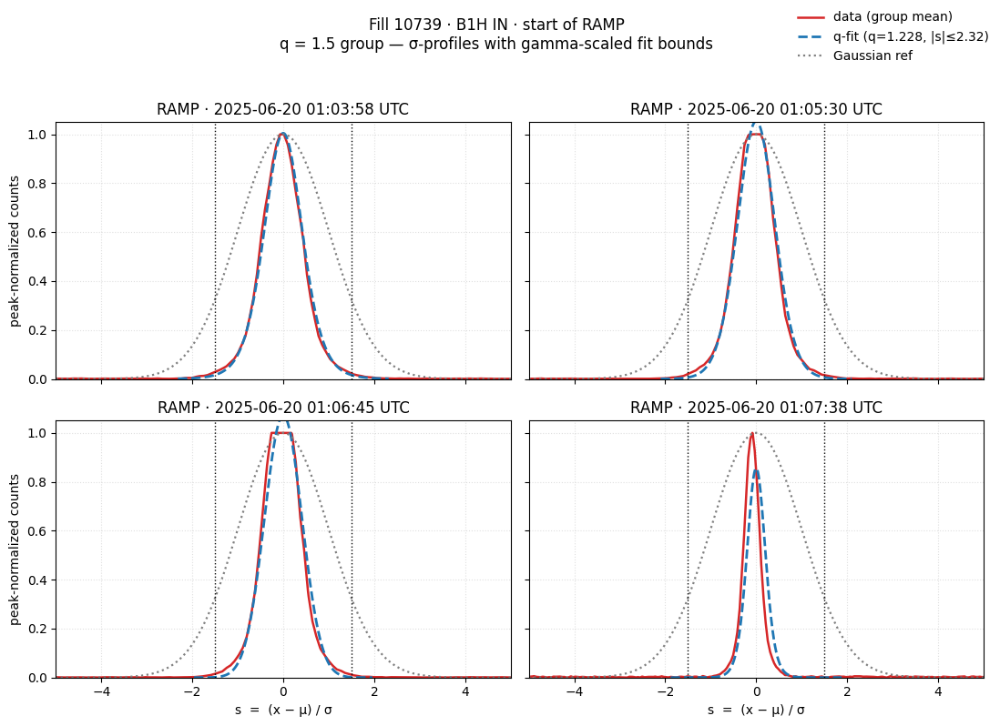

In [54]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ---------------- gamma model & scaling ----------------
M0_GEV = 0.938272081  # proton rest mass (GeV)
E_INJ_GEV  = 450.0
E_FLAT_GEV = 6800.0

def gamma_from_energy(E_GeV: float) -> float:
    return 1.0 + (E_GeV / M0_GEV)

GAMMA_INJ   = gamma_from_energy(E_INJ_GEV)
S_FIT_INJ   = 5.0  # injection reference half-window *in sigma units*

def energy_from_phase_time(ts, phase_windows,
                           E_inj_GeV=E_INJ_GEV, E_flat_GeV=E_FLAT_GEV):
    """Very simple piecewise energy model from your phase windows."""
    # find phase for ts
    ph = None
    for k, win in phase_windows.items():
        if (win["start"] <= ts) and (ts <= win["end"]):
            ph = k; break
    if ph is None:
        return E_inj_GeV
    if ph == "INJPHYS":
        return E_inj_GeV
    if ph in ("FLATTOP", "STABLE"):
        return E_flat_GeV
    if ph == "RAMP":
        t0, t1 = phase_windows["RAMP"]["start"], phase_windows["RAMP"]["end"]
        if t1 <= t0:   # fallback
            return E_inj_GeV
        a = (ts - t0) / (t1 - t0)  # 0→1
        return (1 - a)*E_inj_GeV + a*E_flat_GeV
    return E_inj_GeV

def sigma_fit_halfwidth(ts, phase_windows, s_fit_inj=S_FIT_INJ, gamma_inj=GAMMA_INJ):
    """Gamma-scaled σ-window half-width for the fit."""
    E_t = energy_from_phase_time(ts, phase_windows)
    g_t = gamma_from_energy(E_t)
    return float(s_fit_inj * np.sqrt(gamma_inj / max(g_t, 1.0)))

# ------------- pick first four RAMP timestamps -------------
ramp_q15 = q_df[(q_df["phase"] == "RAMP") & (q_df["group"] == "q = 1.5")].sort_index()
if len(ramp_q15) < 4:
    print(f"Only {len(ramp_q15)} RAMP points available; plotting those.")
sel_ts = ramp_q15.index[:4].to_list()

# ------------- WS columns ----------------------------------
base_tag = f"{DEVICE} {SCAN_KEY}"
pos_c    = find_col(wsdf.columns, "positions", base_tag)
prof_c   = find_col(wsdf.columns, "profiles",  base_tag)
slot_c   = find_col(wsdf.columns, "slots",     base_tag)

# ------------- group profile in σ, with gamma-scaled bounds -------------
def group_profile_in_sigma_with_gamma(row, bunch_ids, ts_fit, phase_windows):
    """Return (s_grid, y_norm, sigma, mu, popt, s_max) for group-mean profile with gamma-scaled fit window."""
    slots = list(map(int, row[slot_c]))
    xall  = row[pos_c]
    yall  = row[prof_c]

    xs, ys = [], []
    for b in bunch_ids:
        if b in slots:
            j  = slots.index(b)
            xr = np.asarray(xall[j], dtype=float)
            yr = pedestal_subtract(np.asarray(yall[j], dtype=float))
            xc, yc, _ = centre_profile(xr, yr)
            o = np.argsort(xc)
            xs.append(xc[o]); ys.append(yc[o])

    if not xs:
        return None

    # align on first bunch grid, compute mean
    x_ref = xs[0]
    Y     = [np.interp(x_ref, xi, yi, left=0, right=0) for xi, yi in zip(xs, ys)]
    y_mean = np.mean(np.vstack(Y), axis=0)

    # moments → μ, σ (on the mean)
    S  = y_mean.sum()
    mu = (x_ref * y_mean).sum() / S
    var= ((x_ref - mu)**2 * y_mean).sum() / S
    sigma = np.sqrt(max(var, 1e-12))

    # to σ-space grid & peak-normalize
    s_raw = (x_ref - mu) / sigma
    s_grid = np.linspace(s_raw.min(), s_raw.max(), 1600)
    y_grid = np.interp(s_grid, s_raw, y_mean, left=0, right=0)
    y_norm = y_grid / max(y_grid.max(), 1.0)

    # q-Gaussian in σ-space: A * [1+(q-1)*b*s^2]^(-1/(q-1))
    def qg_sigma(s, A, b, q):
        z = 1.0 + (q - 1.0) * b * s**2
        z = np.where(z > 1e-14, z, 1e-14)
        return A * z ** (-1.0/(q - 1.0))

    # -------- gamma-scaled σ bounds --------
    s_max = sigma_fit_halfwidth(ts_fit, phase_windows)  # half-range in σ
    msk   = np.abs(s_grid) <= s_max

    # fit inside |s|<=s_max
    A0, b0, q0 = 1.0, 1.0, 1.10
    bounds = ([0.0, 1e-6, 1.00], [np.inf, np.inf, 3.0])
    try:
        popt, _ = curve_fit(qg_sigma, s_grid[msk], y_norm[msk],
                            p0=(A0, b0, q0), bounds=bounds, maxfev=20000)
    except Exception:
        popt = (np.nan, np.nan, np.nan)

    return s_grid, y_norm, sigma, mu, popt, s_max

# ------------- plot the four scans (gamma-scaled bounds) -------------
bunch_ids = GROUPS["q = 1.5"]
fig, axes = plt.subplots(2, 2, figsize=(11, 8), sharex=True, sharey=True)
axes = axes.ravel()

for ax, ts in zip(axes, sel_ts):
    i_near = wsdf.index.get_indexer([ts], method="nearest")[0]
    row    = wsdf.iloc[i_near]
    ts_use = wsdf.index[i_near]

    out = group_profile_in_sigma_with_gamma(row, bunch_ids, ts_use, phase_windows)
    if out is None:
        ax.set_visible(False)
        continue

    s_grid, y_norm, sigma, mu, (Afit, bfit, qfit), s_max = out

    # data
    ax.plot(s_grid, y_norm, lw=1.8, color="tab:red", label="data (group mean)")

    # q-Gaussian fit (within gamma-scaled bounds)
    if np.isfinite(qfit):
        s_fitline = np.linspace(-s_max, s_max, 1000)
        z = 1.0 + (qfit - 1.0) * bfit * s_fitline**2
        z = np.where(z > 1e-14, z, 1e-14)
        y_fitline = Afit * z ** (-1.0/(qfit - 1.0))
        ax.plot(s_fitline, y_fitline, "--", lw=2.0, color="tab:blue",
                label=f"q-fit (q={qfit:.3f}, |s|≤{s_max:.2f})")

    # Gaussian reference
    y_ref = np.exp(-0.5 * s_grid**2); y_ref /= y_ref.max()
    ax.plot(s_grid, y_ref, ":", lw=1.6, color="grey", label="Gaussian ref")

    # tail markers
    ax.axvline(+1.5, ls=":", lw=1.0, color="k")
    ax.axvline(-1.5, ls=":", lw=1.0, color="k")

    ax.set_title(ts_use.strftime("RAMP · %Y-%m-%d %H:%M:%S UTC"))
    ax.set_xlim(-max(5.0, s_max), max(5.0, s_max))
    ax.set_ylim(0, 1.05)
    ax.grid(ls=":", alpha=0.4)

axes[2].set_xlabel("s  =  (x − μ) / σ")
axes[3].set_xlabel("s  =  (x − μ) / σ")
axes[0].set_ylabel("peak-normalized counts")
axes[2].set_ylabel("peak-normalized counts")

# one legend
handles, labels = [], []
for ax in axes:
    h, l = ax.get_legend_handles_labels()
    if h:
        handles, labels = h, l
        break
fig.legend(handles, labels, loc="upper right", frameon=False)
fig.suptitle(f"Fill {FILL} · {DEVICE} {SCAN_KEY} · start of RAMP\n"
             "q = 1.5 group — σ-profiles with gamma-scaled fit bounds",
             y=0.98)
plt.tight_layout(rect=[0,0,1,0.95])
plt.show()


# normalized, reduce freedom, stabilize

Loaded WS table for B2H IN: 138 scans


/tmp/kpervain/ipykernel_450030/3773600241.py:288: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


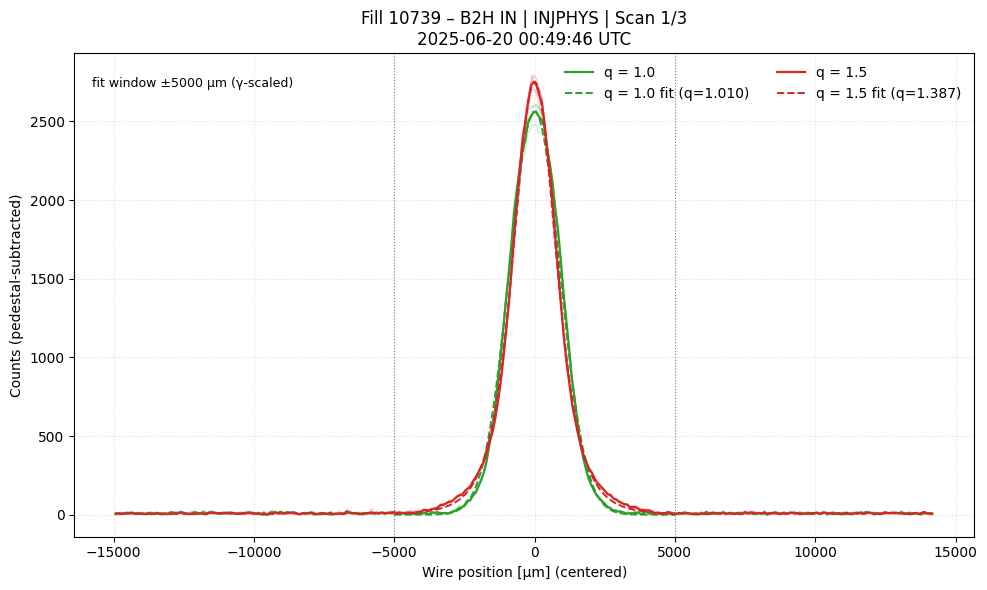

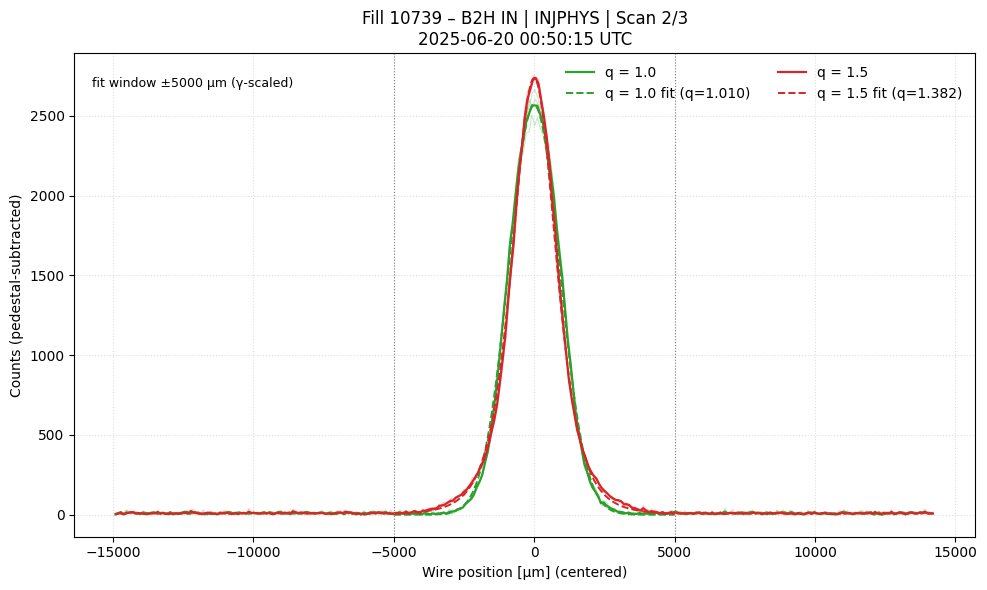

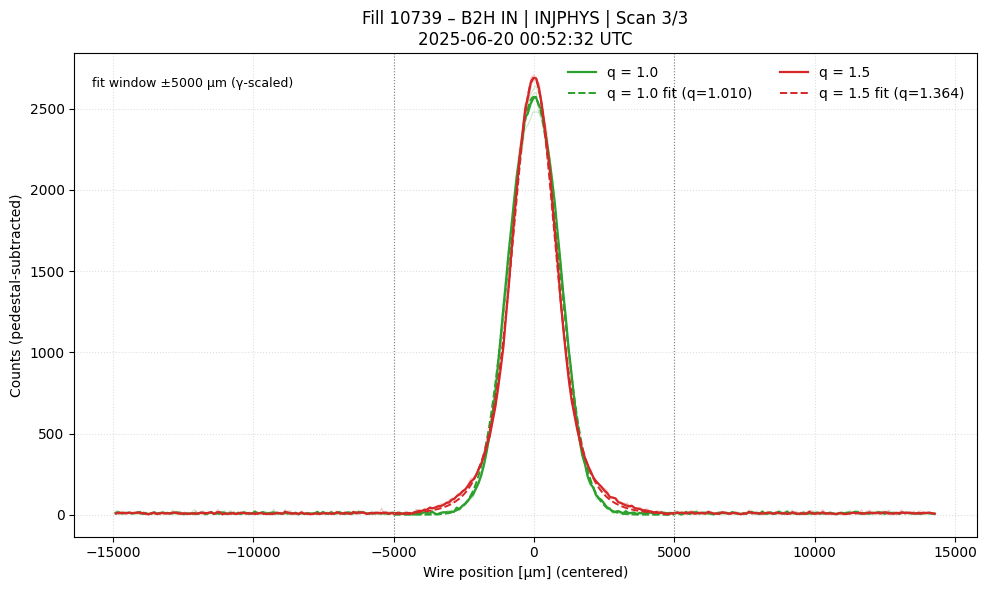

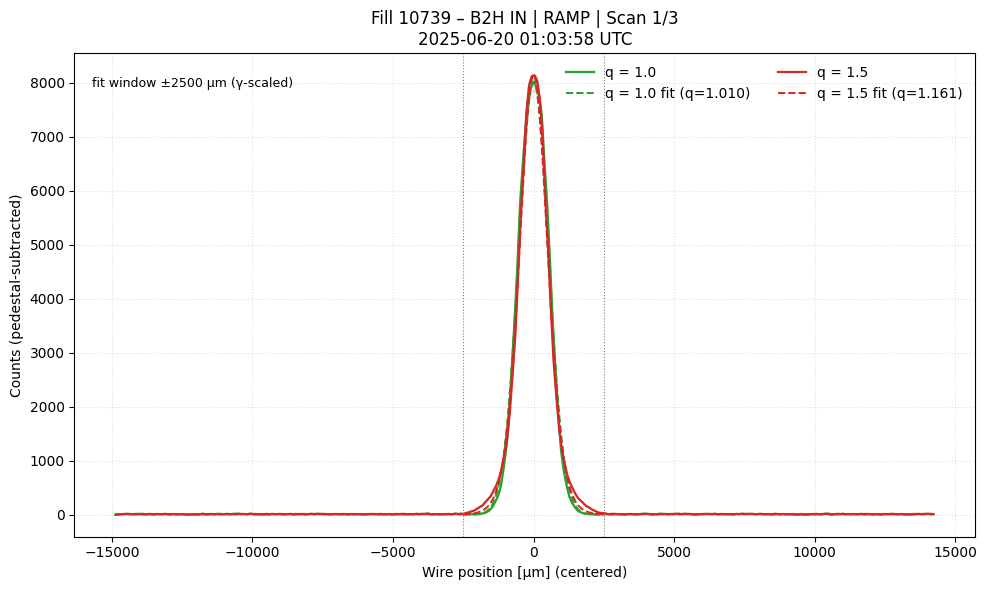

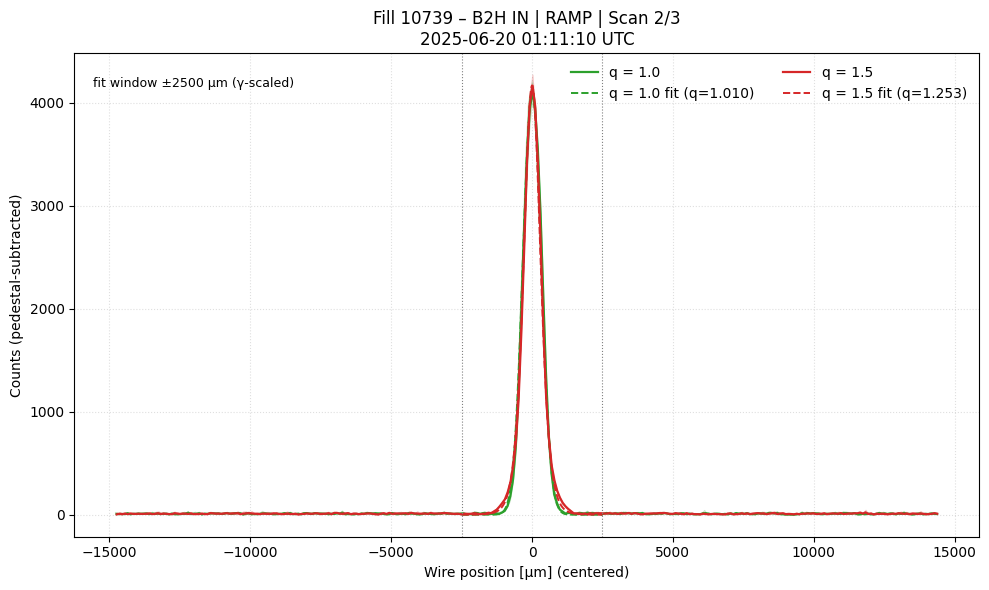

...

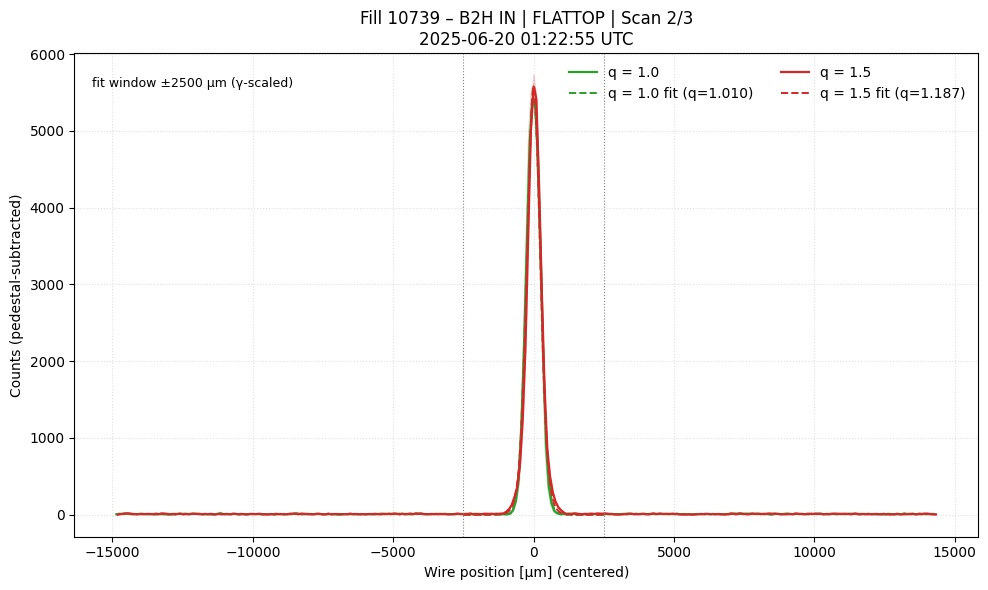

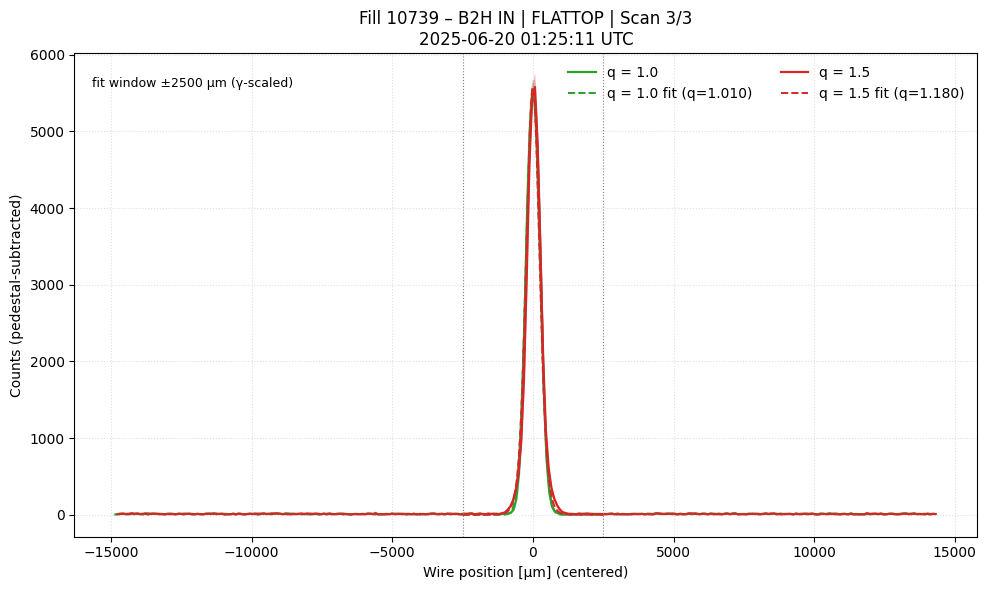

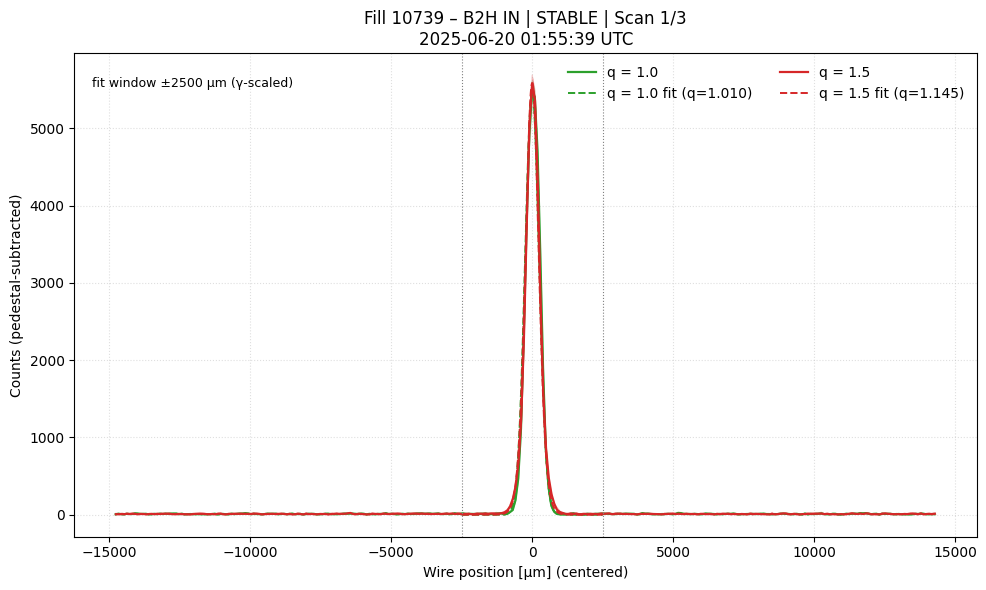

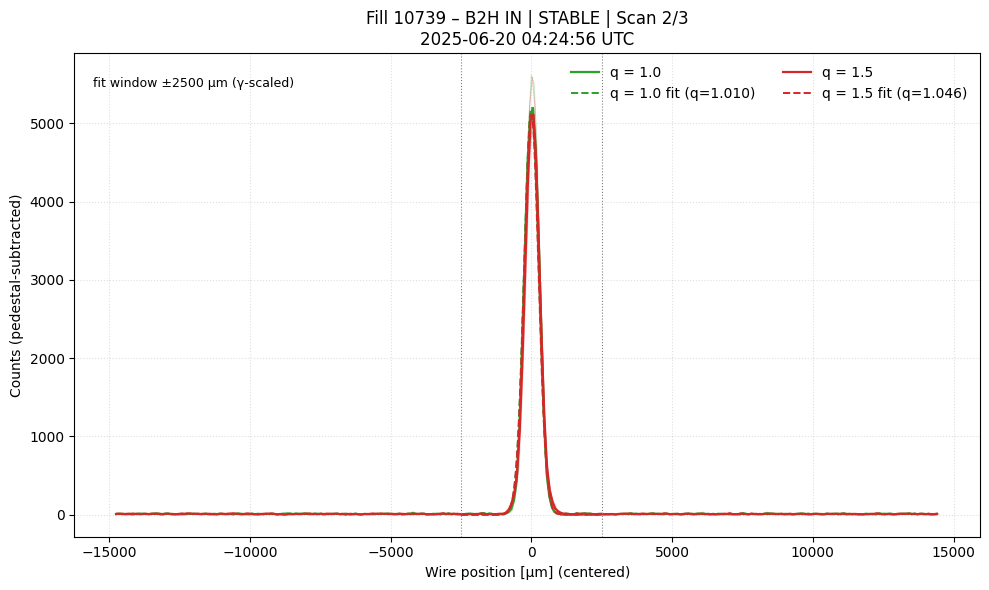

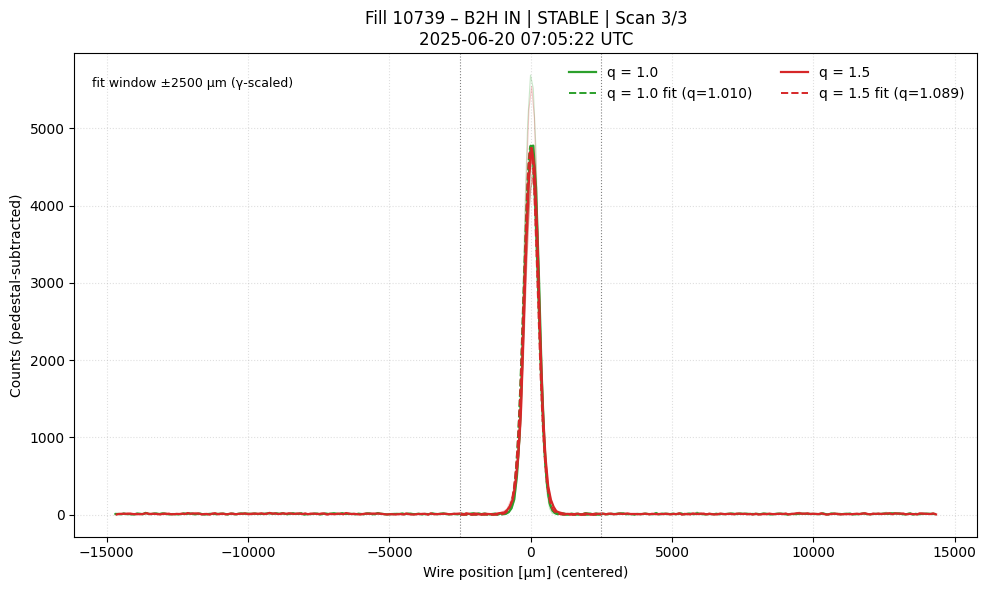

In [59]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
import warnings
from scipy.optimize import curve_fit

warnings.filterwarnings("ignore", category=RuntimeWarning)

FILL      = 10739
DEVICE    = "B2H"                # "B1H" or "B2H"
SCAN_KEY  = "IN"                 # WS key in the pickle ("IN" = scans-in)
PHASES    = ["INJPHYS", "RAMP", "FLATTOP", "STABLE"]
N_SCANS   = 3                    # timestamps per phase to plot

# groups per beam
GROUPS_B1 = {"q = 1.0": [21, 501, 751],
             "q = 1.5": [1251, 1801, 2251]}
GROUPS_B2 = {"q = 1.0": [21, 501, 1051],
             "q = 1.5": [1251, 1801, 2501]}
GROUPS    = GROUPS_B1 if DEVICE.startswith("B1") else GROUPS_B2
NEEDED    = set(sum(GROUPS.values(), []))    # all bunch IDs (for INJPHYS gate)

# selection / appearance
MIN_INJPHYS_TIME = pd.Timestamp("2025-06-20 00:45:00", tz="UTC")
LINEWIDTH   = 1.6
ALPHA_BUNCH = 0.25
COLORS      = {"q = 1.0": "tab:green", "q = 1.5": "tab:red"}

# paths
DATADIR   = Path("/eos/project/l/lhc-lumimod/LuminosityFollowUp/md_data/MD15363")
REPDIR    = Path("/eos/project/l/lhc-lumimod/LuminosityFollowUp/2025/ws_analysis")

# ----------------------- q-Gaussian (x-space, 4-par) ------------------------
def q_gauss(x, A, mu, beta, q):
    """
    Heavy-tailed Tsallis q-Gaussian for 1 < q < 3:
        f(x) = A * [1 + (q-1)*beta*(x-mu)^2]^(-1/(q-1))
    Gaussian limit as q->1: A * exp(-beta*(x-mu)^2)
    """
    x = np.asarray(x, dtype=float)
    z = 1.0 + (q - 1.0) * beta * (x - mu)**2
    z = np.where(z > 1e-14, z, 1e-14)  # prevent tiny/negative
    return A * z ** (-1.0 / (q - 1.0))

# -------------- reduced DoF q-Gaussian (σ-space, 2-par: b, q) ---------------
def qg_sigma(s, b, q):
    """
    σ-normalised q-Gaussian with A=1, mu=0:
        y(s) = [1 + (q-1)*b*s^2]^(-1/(q-1))
    """
    z = 1.0 + (q - 1.0) * b * s**2
    z = np.where(z > 1e-14, z, 1e-14)
    return z ** (-1.0/(q - 1.0))

# ---------------------- utilities --------------------------
def find_col(cols, prefix, tag):
    pat = re.compile(rf"^{prefix}\s*{re.escape(tag)}$", re.I)
    for c in cols:
        if pat.match(re.sub(r"\s+", " ", c)):
            return c
    raise KeyError(f"Column not found: '{prefix} {tag}'")

def pedestal_subtract(y, frac=0.10):
    ped = np.quantile(y, frac)
    y0  = y - ped
    y0[y0 < 0] = 0
    return y0

def centre_profile(x, y):
    s = y.sum()
    if s <= 0:
        return x, y, np.nan
    mu = (x * y).sum() / s
    return x - mu, y, mu

# ---------------------- energy & scaling --------------------
M0_GEV = 0.938272081

def gamma_from_energy(E_GeV: float) -> float:
    return 1.0 + (E_GeV / M0_GEV)

REF_WIN_UM = 5000.0
GAMMA_INJ  = gamma_from_energy(450.0)

def piecewise_energy_from_phase(ts: pd.Timestamp,
                                phase_windows: dict,
                                E_inj_GeV: float = 450.0,
                                E_flat_GeV: float = 6800.0) -> float:
    phase_of_ts = None
    for ph, win in phase_windows.items():
        if win["start"] <= ts <= win["end"]:
            phase_of_ts = ph
            break
    if phase_of_ts is None:
        return E_inj_GeV
    if phase_of_ts == "INJPHYS":
        return E_inj_GeV
    if phase_of_ts in ("FLATTOP", "STABLE"):
        return E_flat_GeV
    if phase_of_ts == "RAMP":
        t0, t1 = phase_windows["RAMP"]["start"], phase_windows["RAMP"]["end"]
        if t1 <= t0:
            return E_inj_GeV
        alpha = (ts - t0) / (t1 - t0)
        return (1 - alpha) * E_inj_GeV + alpha * E_flat_GeV
    return E_inj_GeV

def fit_window_um(ts: pd.Timestamp,
                  phase_windows: dict,
                  ref_win_um: float = REF_WIN_UM,
                  gamma_inj: float = GAMMA_INJ,
                  beta_ratio: float = 1.0,
                  min_win_um: float = 2500.0,
                  max_win_um: float = 30000.0) -> float:
    E = piecewise_energy_from_phase(ts, phase_windows)
    g = gamma_from_energy(E)
    scale = np.sqrt(gamma_inj / max(g, 1.0))
    width = ref_win_um * scale * np.sqrt(max(beta_ratio, 1e-6))
    return float(np.clip(width, min_win_um, max_win_um))

# ---------------------- load WS scans ----------------------
ws_pkl   = REPDIR / f"Fill{FILL}" / f"Analysis_LHC_WS_fill{FILL}.pkl"
wsdf     = pd.read_pickle(ws_pkl)[DEVICE][SCAN_KEY].sort_index()
wsdf.index = wsdf.index.tz_localize("UTC")

base_tag = f"{DEVICE} {SCAN_KEY}"
pos_c, prof_c, slot_c = (find_col(wsdf.columns, k, base_tag)
                         for k in ("positions", "profiles", "slots"))

print(f"Loaded WS table for {DEVICE} {SCAN_KEY}: {len(wsdf)} scans")

# ---------------------- phase windows (MD) -----------------
def first_interval(bmode):
    folder = DATADIR / f"HX:FILLN={FILL}" / f"HX:BMODE={bmode}"
    t0 = t1 = None
    for pq in folder.rglob("*.parquet"):
        try:
            df  = pd.read_parquet(pq)
            idx = pd.to_datetime(df.index, utc=True, errors="coerce").dropna()
            if idx.empty:
                continue
            lo, hi = idx.min(), idx.max()
            t0 = lo if t0 is None else min(t0, lo)
            t1 = hi if t1 is None else max(t1, hi)
        except Exception:
            continue
    return None if t0 is None else pd.Series({"start": t0, "end": t1})

phase_windows = {ph: first_interval(ph) for ph in PHASES}
phase_windows = {ph: w for ph, w in phase_windows.items() if w is not None}

# ---------------------- choose scans per phase --------------
def pick_scans(window, require_all=False, min_time=None, n=N_SCANS):
    scans = wsdf.loc[window["start"]: window["end"]]
    if min_time is not None:
        scans = scans[scans.index >= min_time]
    if require_all:
        scans = scans[scans[slot_c].apply(lambda s: set(map(int, s)).issuperset(NEEDED))]
    if scans.empty:
        return []
    idxs = np.round(np.linspace(0, len(scans) - 1, n)).astype(int)
    return [scans.index[i] for i in idxs]

phase_scans = {}
for ph, win in phase_windows.items():
    req_all = (ph == "INJPHYS")
    min_t   = MIN_INJPHYS_TIME if ph == "INJPHYS" else None
    stamps  = pick_scans(win, require_all=req_all, min_time=min_t, n=N_SCANS)
    if stamps:
        phase_scans[ph] = stamps

# --------------- fit & overlay for each timestamp ----------
def fit_q_gaussian_to_group(row, bunch_ids, color, ax, label, ts_for_window, beta_ratio=1.0):
    """
    • plot faint individual bunch traces (ped-subtracted & centered),
    • plot the group mean (solid),
    • **NORMALISE & CENTER IN σ BEFORE FIT** (A=1, μ=0), fit only (b, q),
    • fit window |x| ≤ Δx(ts) (γ-scaled), i.e. |s| ≤ Δx/σ,
    • overlay dashed fit back in original (µm, counts) units.
    Returns (q, b_as_beta, mu, A, win_um) or None if fit fails.
    """
    slots = list(map(int, row[slot_c]))
    xall  = row[pos_c]
    yall  = row[prof_c]

    xs = []
    ys = []
    for b in bunch_ids:
        if b not in slots:
            continue
        j  = slots.index(b)
        xr = np.asarray(xall[j], dtype=float)
        yr = pedestal_subtract(np.asarray(yall[j], dtype=float))
        xc, yc, _ = centre_profile(xr, yr)
        o = np.argsort(xc)
        xs.append(xc[o]); ys.append(yc[o])
        ax.plot(xc[o], yc[o], color=color, alpha=ALPHA_BUNCH, lw=0.8)  # raw bunch

    if not xs:
        return None

    # Align on first bunch grid & mean
    x_ref = xs[0]
    Y     = [np.interp(x_ref, xi, yi, left=0, right=0) for xi, yi in zip(xs, ys)]
    y_mean = np.mean(np.vstack(Y), axis=0)

    # Draw mean (original units)
    ax.plot(x_ref, y_mean, color=color, lw=LINEWIDTH, label=label)

    # ---- compute μ, σ from the mean; build σ-space & peak-normalise ----
    S  = float(y_mean.sum())
    if S <= 0:
        return None
    mu = float((x_ref * y_mean).sum() / S)
    var = float(((x_ref - mu)**2 * y_mean).sum() / S)
    sigma = float(np.sqrt(max(var, 1e-12)))

    s_raw   = (x_ref - mu) / sigma
    y_peak  = float(y_mean.max())
    if y_peak <= 0:
        return None
    # monotone σ-grid, same length, and peak-normalised data
    s_grid  = np.linspace(s_raw.min(), s_raw.max(), len(s_raw))
    y_norm  = np.interp(s_grid, s_raw, y_mean, left=0, right=0) / y_peak

    # ---- γ-scaled fit window: |x|≤Δx ⇒ |s|≤Δx/σ ----
    win_um = fit_window_um(ts_for_window, phase_windows, beta_ratio=beta_ratio)
    s_max  = float(win_um / max(sigma, 1e-6))
    if not np.isfinite(s_max) or s_max <= 0:
        s_max = 5.0
    msk = np.abs(s_grid) <= s_max
    if not np.any(msk):
        msk = slice(None)

    # ---- 2-parameter fit in σ-space (A fixed=1, μ fixed=0) ----
    p0     = (1.0, 1.10)                           # (b, q)
    bounds = ([1e-6, 1.01], [np.inf, 3.0])
    try:
        (b_fit, q_fit), _ = curve_fit(
            qg_sigma, s_grid[msk], y_norm[msk],
            p0=p0, bounds=bounds, maxfev=20000
        )
        # map back to original units for overlay
        s_fit = np.linspace(-s_max, s_max, 1200)
        y_fit = qg_sigma(s_fit, b_fit, q_fit) * y_peak
        x_fit = s_fit * sigma + mu
        ax.plot(x_fit, y_fit, color=color, ls="--", lw=1.4,
                label=f"{label} fit (q={q_fit:.3f})")
        # return in same shape as before (beta := b/σ^2 proxy, keep mu, A)
        beta_proxy = b_fit / (sigma**2)  # just so the tuple matches prior meaning
        return q_fit, beta_proxy, mu, y_peak, win_um
    except Exception:
        return None

# ---------------------- run plots for all scans --------------
for ph, stamps in phase_scans.items():
    for i, ts in enumerate(stamps, 1):
        row = wsdf.loc[ts]

        fig, ax = plt.subplots(figsize=(10, 6))
        results = {}
        for lbl, bunch_ids in GROUPS.items():
            out = fit_q_gaussian_to_group(row, bunch_ids, COLORS[lbl], ax, lbl,
                                          ts_for_window=ts,
                                          beta_ratio=1.0)   # if you know β-ratio per phase, set it
            results[lbl] = out

        # annotate chosen window half-width for info (in µm)
        try:
            win_um = fit_window_um(ts, phase_windows)
            ax.axvline(+win_um, color="grey", lw=0.8, ls=":")
            ax.axvline(-win_um, color="grey", lw=0.8, ls=":")
            ax.text(0.02, 0.95, f"fit window ±{int(win_um)} µm (γ-scaled)",
                    transform=ax.transAxes, ha="left", va="top", fontsize=9)
        except Exception:
            pass

        ax.set_title(
            f"Fill {FILL} – {DEVICE} {SCAN_KEY} | {ph} | Scan {i}/{len(stamps)}\n"
            f"{ts.strftime('%Y-%m-%d %H:%M:%S UTC')}"
        )
        ax.set_xlabel("Wire position [µm] (centered)")
        ax.set_ylabel("Counts (pedestal-subtracted)")
        ax.grid(ls=":", alpha=0.4)
        ax.legend(ncol=2, frameon=False)
        plt.tight_layout()
        plt.show()


Loaded WS table for B1H IN: 140 scans


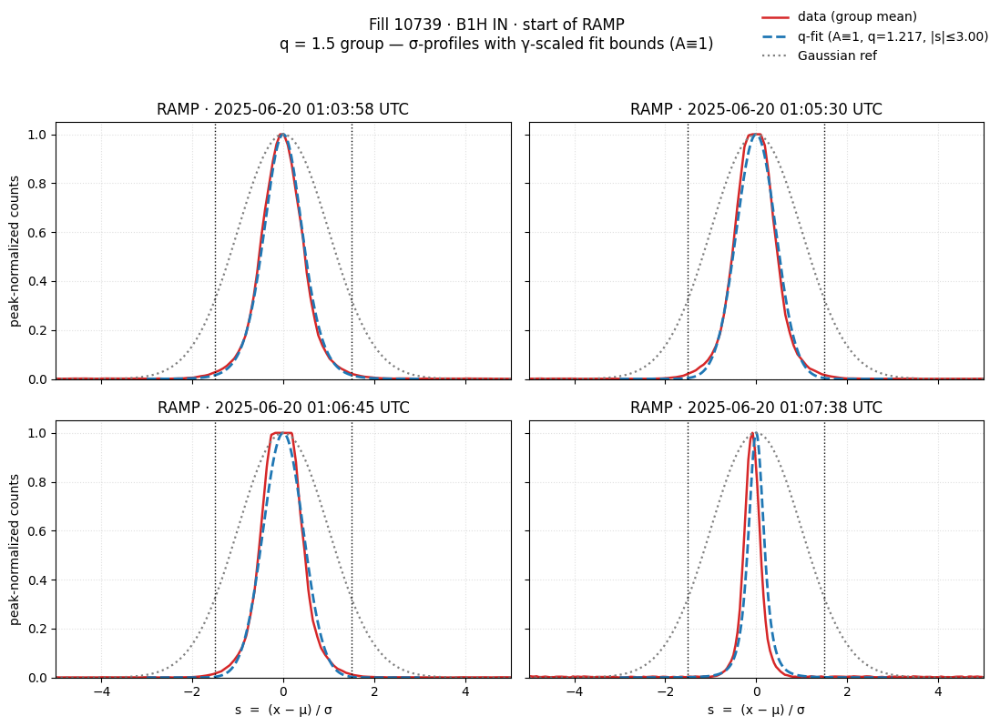

In [ ]:
# ====================== configuration ======================
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re, warnings
from scipy.optimize import least_squares

warnings.filterwarnings("ignore", category=RuntimeWarning)

FILL      = 10739
DEVICE    = "B1H"                # "B1H" or "B2H"/"B1V"/"B2V"
SCAN_KEY  = "IN"                 # WS key in the pickle
PHASES    = ["INJPHYS", "RAMP", "FLATTOP", "STABLE"]

# groups per beam
GROUPS_B1 = {"q = 1.0": [21, 501,  751],
             "q = 1.5": [1251, 1801, 2251]}
GROUPS_B2 = {"q = 1.0": [21, 501, 1051],
             "q = 1.5": [1251, 1801, 2501]}
GROUPS    = GROUPS_B1 if DEVICE.startswith("B1") else GROUPS_B2

# paths
DATADIR   = Path("/eos/project/l/lhc-lumimod/LuminosityFollowUp/md_data/MD15363")
REPDIR    = Path("/eos/project/l/lhc-lumimod/LuminosityFollowUp/2025/ws_analysis")

# appearance
COLORS = {"q = 1.0": "tab:green", "q = 1.5": "tab:red"}
# ===========================================================


# ---------------------- utilities --------------------------
def find_col(cols, prefix, tag):
    pat = re.compile(rf"^{prefix}\s*{re.escape(tag)}$", re.I)
    for c in cols:
        if pat.match(re.sub(r"\s+", " ", c)):
            return c
    raise KeyError(f"Column not found: '{prefix} {tag}'")

def pedestal_subtract(y, frac=0.10):
    ped = np.quantile(y, frac)
    y0  = y - ped
    y0[y0 < 0] = 0
    return y0

def centre_profile(x, y):
    s = y.sum()
    if s <= 0:
        return x, y, np.nan
    mu = (x * y).sum() / s
    return x - mu, y, mu


# ---------------------- load WS scans ----------------------
ws_pkl   = REPDIR / f"Fill{FILL}" / f"Analysis_LHC_WS_fill{FILL}.pkl"
wsdf     = pd.read_pickle(ws_pkl)[DEVICE][SCAN_KEY].sort_index()
wsdf.index = wsdf.index.tz_localize("UTC")

base_tag = f"{DEVICE} {SCAN_KEY}"
pos_c, prof_c, slot_c = (find_col(wsdf.columns, k, base_tag)
                         for k in ("positions", "profiles", "slots"))

print(f"Loaded WS table for {DEVICE} {SCAN_KEY}: {len(wsdf)} scans")


# ---------------------- phase windows (MD) -----------------
def first_interval(bmode):
    folder = DATADIR / f"HX:FILLN={FILL}" / f"HX:BMODE={bmode}"
    t0 = t1 = None
    for pq in folder.rglob("*.parquet"):
        try:
            df  = pd.read_parquet(pq)
            idx = pd.to_datetime(df.index, utc=True, errors="coerce").dropna()
            if idx.empty:
                continue
            lo, hi = idx.min(), idx.max()
            t0 = lo if t0 is None else min(t0, lo)
            t1 = hi if t1 is None else max(t1, hi)
        except Exception:
            continue
    return None if t0 is None else pd.Series({"start": t0, "end": t1})

phase_windows = {ph: first_interval(ph) for ph in PHASES}
phase_windows = {ph: w for ph, w in phase_windows.items() if w is not None}
assert "RAMP" in phase_windows, "RAMP window not found from MD parquet."


# ---------------------- gamma scaling ----------------------
M0_GEV = 0.938272081     # proton rest mass (GeV)
E_INJ_GEV  = 450.0
E_FLAT_GEV = 6800.0

def gamma_from_energy(E_GeV: float) -> float:
    return 1.0 + (E_GeV / M0_GEV)

GAMMA_INJ = gamma_from_energy(E_INJ_GEV)
S_FIT_INJ = 5.0  # reference half-window at injection in σ units

def energy_from_phase_time(ts, phase_windows,
                           E_inj_GeV=E_INJ_GEV, E_flat_GeV=E_FLAT_GEV):
    ph = None
    for k, win in phase_windows.items():
        if (win["start"] <= ts) and (ts <= win["end"]):
            ph = k; break
    if ph is None:
        return E_inj_GeV
    if ph == "INJPHYS":
        return E_inj_GeV
    if ph in ("FLATTOP", "STABLE"):
        return E_flat_GeV
    if ph == "RAMP":
        t0, t1 = phase_windows["RAMP"]["start"], phase_windows["RAMP"]["end"]
        if t1 <= t0:
            return E_inj_GeV
        a = (ts - t0) / (t1 - t0)
        return (1 - a)*E_inj_GeV + a*E_flat_GeV
    return E_inj_GeV

def sigma_fit_halfwidth(ts, phase_windows, s_fit_inj=S_FIT_INJ, gamma_inj=GAMMA_INJ):
    E_t = energy_from_phase_time(ts, phase_windows)
    g_t = gamma_from_energy(E_t)
    return float(s_fit_inj * np.sqrt(gamma_inj / max(g_t, 1.0)))


# ---------------- q-Gaussian in σ (A fixed to 1) -----------
def qg_sigma_unitA(s, b, q):
    z = 1.0 + (q - 1.0) * b * s**2
    z = np.where(z > 1e-14, z, 1e-14)
    return z ** (-1.0/(q - 1.0))

def fit_q_sigma_reduced(s, y, s_max_gamma, s_min=3.0):
    """
    Fit y(s) with A fixed to 1: y ≈ [1+(q-1)*b*s^2]^(-1/(q-1)),
    robust soft-L1, Poisson-like weights; fit only for |s| <= s_used.
    """
    s_used = max(float(s_min), float(s_max_gamma))
    msk    = np.abs(s) <= s_used
    s_fit, y_fit = s[msk], y[msk]

    w = 1.0 / np.sqrt(np.maximum(y_fit, 1.0))  # Poisson-ish weights

    def resid(par):
        b, q = par
        return (qg_sigma_unitA(s_fit, b, q) - y_fit) * w

    p0 = np.array([1.0, 1.10])     # initial b, q
    lb = np.array([1e-6, 1.00])
    ub = np.array([np.inf, 3.00])
    sol = least_squares(resid, p0, bounds=(lb, ub),
                        loss="soft_l1", f_scale=1.0, max_nfev=30000)
    b_fit, q_fit = sol.x
    return b_fit, q_fit, s_used


# -------- group profile in σ with gamma-scaled fit window ---
def group_profile_in_sigma_with_gamma(row, bunch_ids, ts_fit, phase_windows):
    """
    Returns: (s_grid, y_norm, sigma, mu, (b_fit, q_fit), s_used)
    """
    slots = list(map(int, row[slot_c]))
    xall  = row[pos_c]
    yall  = row[prof_c]

    xs, ys = [], []
    for b in bunch_ids:
        if b in slots:
            j  = slots.index(b)
            xr = np.asarray(xall[j], dtype=float)
            yr = pedestal_subtract(np.asarray(yall[j], dtype=float))
            xc, yc, _ = centre_profile(xr, yr)    # center each bunch
            o = np.argsort(xc)
            xs.append(xc[o]); ys.append(yc[o])

    if not xs:
        return None

    # align on first bunch grid and compute the group mean
    x_ref = xs[0]
    Y     = [np.interp(x_ref, xi, yi, left=0, right=0) for xi, yi in zip(xs, ys)]
    y_mean = np.mean(np.vstack(Y), axis=0)

    # moments on the mean → μ, σ
    S  = y_mean.sum()
    mu = (x_ref * y_mean).sum() / S
    var= ((x_ref - mu)**2 * y_mean).sum() / S
    sigma = np.sqrt(max(var, 1e-12))

    # to σ-space and peak-normalize (A ≡ 1)
    s_raw  = (x_ref - mu) / sigma
    s_grid = np.linspace(s_raw.min(), s_raw.max(), 1600)
    y_grid = np.interp(s_grid, s_raw, y_mean, left=0, right=0)
    y_norm = y_grid / max(y_grid.max(), 1.0)

    # gamma-scaled bounds and reduced-parameter fit
    s_max  = sigma_fit_halfwidth(ts_fit, phase_windows)
    b_fit, q_fit, s_used = fit_q_sigma_reduced(s_grid, y_norm, s_max, s_min=3.0)

    return s_grid, y_norm, sigma, mu, (b_fit, q_fit), s_used


# ------------- select four earliest RAMP scans -------------
ramp_win = phase_windows["RAMP"]
ramp_idx = wsdf.loc[ramp_win["start"]:ramp_win["end"]].index
sel_ts   = list(ramp_idx[:4])  # first four timestamps


# ------------- plot the four scans (q = 1.5 group) ---------
bunch_ids = GROUPS["q = 1.5"]
fig, axes = plt.subplots(2, 2, figsize=(11, 8), sharex=True, sharey=True)
axes = axes.ravel()

for ax, ts in zip(axes, sel_ts):
    # be robust to sub-µs differences: snap to nearest row
    i_near = wsdf.index.get_indexer([ts], method="nearest")[0]
    row    = wsdf.iloc[i_near]
    ts_use = wsdf.index[i_near]

    out = group_profile_in_sigma_with_gamma(row, bunch_ids, ts_use, phase_windows)
    if out is None:
        ax.set_visible(False)
        continue

    s_grid, y_norm, sigma, mu, (bfit, qfit), s_used = out

    # data (group mean, centered & peak-normalized)
    ax.plot(s_grid, y_norm, lw=1.8, color="tab:red", label="data (group mean)")

    # q-Gaussian fit with A fixed to 1 for |s|<=s_used
    s_fitline = np.linspace(-s_used, s_used, 1200)
    y_fitline = qg_sigma_unitA(s_fitline, bfit, qfit)
    ax.plot(s_fitline, y_fitline, "--", lw=2.0, color="tab:blue",
            label=f"q-fit (A≡1, q={qfit:.3f}, |s|≤{s_used:.2f})")

    # Gaussian reference
    y_ref = np.exp(-0.5 * s_grid**2); y_ref /= y_ref.max()
    ax.plot(s_grid, y_ref, ":", lw=1.6, color="grey", label="Gaussian ref")

    # tail markers
    ax.axvline(+1.5, ls=":", lw=1.0, color="k")
    ax.axvline(-1.5, ls=":", lw=1.0, color="k")

    ax.set_title(ts_use.strftime("RAMP · %Y-%m-%d %H:%M:%S UTC"))
    ax.set_xlim(-max(5.0, s_used), max(5.0, s_used))
    ax.set_ylim(0, 1.05)
    ax.grid(ls=":", alpha=0.4)

axes[2].set_xlabel("s  =  (x ) / σ")
axes[3].set_xlabel("s  =  (x) / σ")
axes[0].set_ylabel("peak-normalized counts")
axes[2].set_ylabel("peak-normalized counts")

# one legend
handles, labels = [], []
for ax in axes:
    h, l = ax.get_legend_handles_labels()
    if h:
        handles, labels = h, l
        break
fig.legend(handles, labels, loc="upper right", frameon=False)
fig.suptitle(f"Fill {FILL} · {DEVICE} {SCAN_KEY} · start of RAMP\n"
             "q = 1.5 group — σ-profiles with γ-scaled fit bounds (A≡1)",
             y=0.98)
plt.tight_layout(rect=[0,0,1,0.95])
plt.show()


Using scan at: 2025-06-20 01:07:38.928993475+00:00

Per-bunch q for q = 1.5 at 2025-06-20 01:07:38.928993475+00:00:
  B1251: q = 1.171
  B1801: q = 1.194
Median q = 1.183


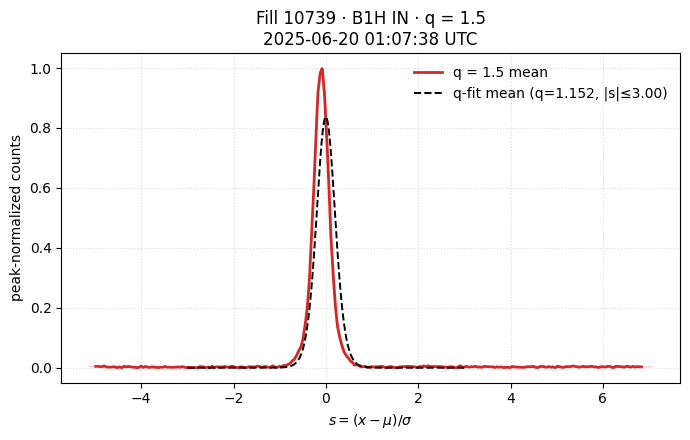

In [ ]:
# ====================== setup & imports ======================
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
from scipy.optimize import least_squares

# ---------------------- configuration -----------------------
FILL      = 10739
DEVICE    = "B1H"             # "B1H" or "B2H"
SCAN_KEY  = "IN"
REPDIR    = Path("/eos/project/l/lhc-lumimod/LuminosityFollowUp/2025/ws_analysis")

# pick the timestamp you want to analyse (UTC-aware)
t_scan    = pd.Timestamp("2025-06-20 01:07:38", tz="UTC")

GROUPS_B1 = {"q = 1.0": [21, 501, 751], 
             "q = 1.5": [1251, 1801, 2251]} #, 2251
GROUPS_B2 = {"q = 1.0": [21, 501, 1051], #
             "q = 1.5": [1251, 1801, 2501]} #, 2501
GROUPS    = GROUPS_B1 if DEVICE.startswith("B1") else GROUPS_B2
GROUP_LABEL = "q = 1.5"       # <-- which group to analyse here

# ---------------------- helpers ------------------------------
def find_col(cols, prefix, tag):
    """Find a column like 'profiles  B1H IN' ignoring double spaces/case."""
    pat = re.compile(rf"^{prefix}\s*{re.escape(tag)}$", re.I)
    for c in cols:
        if pat.match(re.sub(r"\s+", " ", c)):
            return c
    raise KeyError(f"Column not found: '{prefix} {tag}'")

def pedestal_subtract(y, frac=0.10):
    """Subtract a robust baseline; clip to 0."""
    ped = np.quantile(y, frac)
    y0  = y - ped
    y0[y0 < 0] = 0.0
    return y0

# ------------------ q-Gaussian in σ-space --------------------
# s = (x - μ)/σ ; model: A * [1 + (q-1)*b*s^2]^(-1/(q-1))
def qg_sigma(s, A, b, q):
    z = 1.0 + (q - 1.0)*b*np.asarray(s)**2
    z = np.where(z > 1e-14, z, 1e-14)
    return A * z**(-1.0/(q - 1.0))

def fit_q_sigma_robust(s, y, s_max_gamma=3.0, s_min=3.0):
    """
    Robust fit of q-Gaussian in σ-space using soft-L1 loss and
    Poisson-like weights (1/sqrt(y)). Only uses |s| <= max(s_min, s_max_gamma).
    Returns (A, b, q), s_used.
    """
    s_max = max(float(s_min), float(s_max_gamma))
    msk   = np.abs(s) <= s_max
    s_fit, y_fit = s[msk], y[msk]

    # Poisson-ish weights so tails are not ignored
    w = 1.0 / np.sqrt(np.maximum(y_fit, 1.0))

    def resid(par):
        A, b, q = par
        return (qg_sigma(s_fit, A, b, q) - y_fit) * w

    p0 = np.array([1.0, 1.0, 1.10])
    lb = np.array([0.0, 1e-6, 1.00])
    ub = np.array([np.inf, np.inf, 3.0])

    sol = least_squares(resid, p0, bounds=(lb, ub),
                        loss="soft_l1", f_scale=1.0, max_nfev=30000)
    return sol.x, s_max

def per_bunch_qs_sigma(bunch_ids, slots, x_arrays, y_arrays,
                       ped_frac=0.10, s_max_gamma=3.0, n_grid=1600):
    """
    Compute per-bunch q for all bunch_ids present in this scan.
    Returns (bunch_list_present, q_values, per-bunch dict with norms/grids).
    """
    present = [b for b in bunch_ids if b in slots]
    qs = []
    per_bunch = {}

    for b in present:
        j  = slots.index(b)
        x  = np.asarray(x_arrays[j], dtype=float)
        y  = pedestal_subtract(np.asarray(y_arrays[j], dtype=float), frac=ped_frac)

        # moments -> μ, σ
        S = y.sum()
        if S <= 0:
            qs.append(np.nan)
            continue
        mu  = (x*y).sum()/S
        sig = np.sqrt(((x - mu)**2 * y).sum()/S)
        if not np.isfinite(sig) or sig <= 0:
            qs.append(np.nan)
            continue

        # go to σ-space and peak-normalize for shape fit
        s   = (x - mu)/sig
        ypk = y / max(y.max(), 1.0)

        # put on a uniform grid to avoid uneven sampling artifacts
        s_grid = np.linspace(s.min(), s.max(), n_grid)
        y_grid = np.interp(s_grid, s, ypk, left=0, right=0)

        (A,beta,q), s_used = fit_q_sigma_robust(s_grid, y_grid,
                                                s_max_gamma=s_max_gamma, s_min=3.0)
        qs.append(q)
        per_bunch[b] = dict(mu=mu, sigma=sig, s=s_grid, y=y_grid,
                            A=A, beta=beta, q=q, s_used=s_used)

    return present, np.array(qs, dtype=float), per_bunch

# =================== load WS and run once ===================
# load WS dataframe
ws_pkl = REPDIR / f"Fill{FILL}" / f"Analysis_LHC_WS_fill{FILL}.pkl"
wsdf   = pd.read_pickle(ws_pkl)[DEVICE][SCAN_KEY].sort_index()
wsdf.index = wsdf.index.tz_localize("UTC")

# locate columns
tag    = f"{DEVICE} {SCAN_KEY}"
pos_c  = find_col(wsdf.columns, "positions", tag)
prof_c = find_col(wsdf.columns, "profiles",  tag)
slot_c = find_col(wsdf.columns, "slots",     tag)

# find the **closest** available scan to t_scan (in case exact ts not present)
ts_all = wsdf.index
i_best = np.argmin(np.abs(ts_all - t_scan))
ts     = ts_all[i_best]
print("Using scan at:", ts)

row   = wsdf.loc[ts]
slots = list(map(int, row[slot_c]))
xlist = row[pos_c]
ylist = row[prof_c]

# ---- compute per-bunch q’s for the chosen group ----
bunches, q_vals, per_bunch = per_bunch_qs_sigma(
    GROUPS[GROUP_LABEL], slots, xlist, ylist, s_max_gamma=3.0
)

print(f"\nPer-bunch q for {GROUP_LABEL} at {ts}:")
for b in bunches:
    print(f"  B{b}: q = {per_bunch[b]['q']:.3f}")
print(f"Median q = {np.nanmedian(q_vals):.3f}")

# ---- optional: plot group-mean profile in σ-space + median-q fit ----
if bunches:
    # build group mean on a common s-grid
    # (normalize each to peak 1 before averaging for a pure shape mean)
    s_common = per_bunch[bunches[0]]["s"]
    Y = [per_bunch[b]["y"] for b in bunches]
    y_mean = np.mean(np.vstack(Y), axis=0)
    y_mean /= max(y_mean.max(), 1.0)

    # fit again to the mean, with the same robust routine
    (A_m, b_m, q_m), s_used = fit_q_sigma_robust(s_common, y_mean, s_max_gamma=3.0, s_min=3.0)
    s_fit = np.linspace(-s_used, s_used, 1200)
    y_fit = qg_sigma(s_fit, A_m, b_m, q_m)

    plt.figure(figsize=(7,4.5))
    for b in bunches:
        plt.plot(per_bunch[b]["s"], per_bunch[b]["y"], color="tab:red", alpha=0.25, lw=0.8)
    plt.plot(s_common, y_mean, color="tab:red", lw=2.0, label=f"{GROUP_LABEL} mean")
    plt.plot(s_fit,    y_fit,   "--", color="k", lw=1.4,
             label=f"q-fit mean (q={q_m:.3f}, |s|≤{s_used:.2f})")
    plt.title(f"Fill {FILL} · {DEVICE} {SCAN_KEY} · {GROUP_LABEL}\n{ts.strftime('%Y-%m-%d %H:%M:%S UTC')}")
    plt.xlabel(r"$s=(x-\mu)/\sigma$")
    plt.ylabel("peak-normalized counts")
    plt.grid(ls=":", alpha=0.4)
    plt.legend(frameon=False)
    plt.tight_layout()
    plt.show()


# intensity

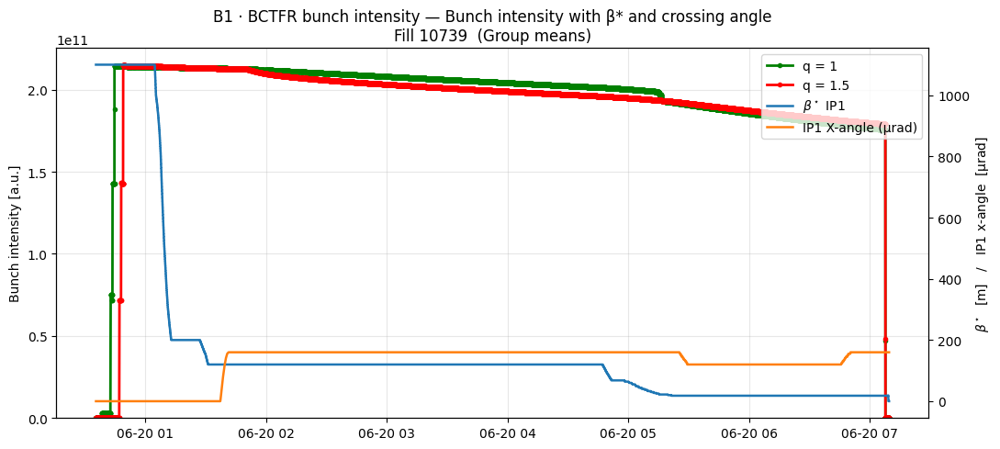

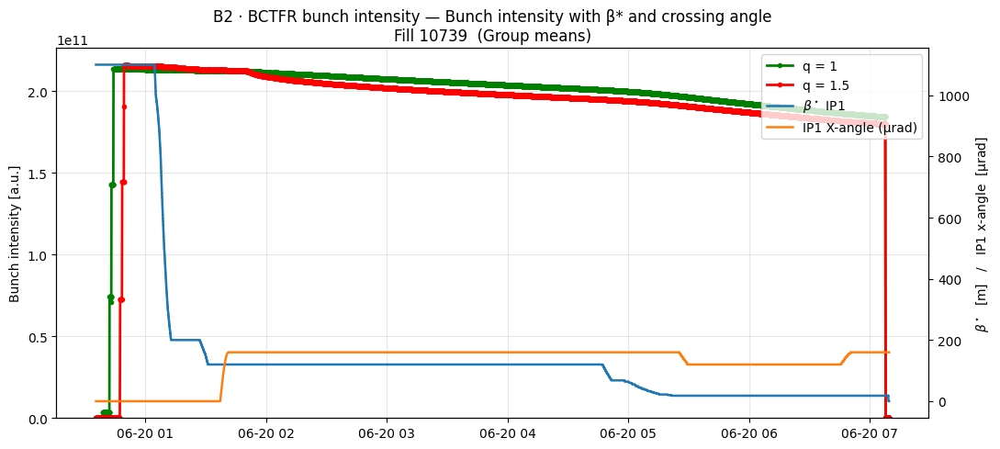

In [ ]:
# ====================== configuration ======================
from pathlib import Path
import numpy as np
import pandas as pd
import dask.dataframe as dd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# ---- paths / fill ----
FILL = 10739
BASE = Path("/eos/project/l/lhc-lumimod/LuminosityFollowUp/md_data/MD15363")
DATADIR = BASE / f"HX:FILLN={FILL}"

# ---- BCTFR PVs ----
BCT_B1_PV = "LHC.BCTFR.A6R4.B1:BUNCH_INTENSITY"
BCT_B2_PV = "LHC.BCTFR.A6R4.B2:BUNCH_INTENSITY"

# ---- machine PVs on the right y-axis ----
BETASTAR_PV = "HX:BETASTAR_IP1"                         # [m]
XING_PV     = "LhcStateTracker:LHCBEAM:IP1-XING-H-MURAD:value"  # [µrad]

# ---- groups (beam dependent) ----
BUNCH_GROUPS_B1 = { 
    "q = 1"  : ([20, 500], "green"),
    "q = 1.5": ([1250, 1800], "red"),
}
BUNCH_GROUPS_B2 = { 
    "q = 1"  : ([20, 500], "green"),
    "q = 1.5": ([1250, 1800], "red"),
}

# Optional: highlight a single bunch (set to None to disable)
SOLO_BID_B1 = None   # e.g. 2874
SOLO_BID_B2 = None

# Plot options
dynamic_ylim = True       # autoscale y-axis from data
title_suffix = "Group means"
xlim_left = None          # e.g. pd.Timestamp("2025-06-20 01:50")

# ===========================================================

def load_bunch_array(parquet_dir: Path, pv_name: str, bid_list):
    """
    Load a PV that stores a 3564-length array per row (bunch-by-bunch).
    Returns a DataFrame of shape (nTimes × len(bid_list)).
    """
    raw = (
        dd.read_parquet(parquet_dir.as_posix(), columns=[pv_name])
          .dropna()
          .compute()
    )
    # Make sure the index is time-like; many MD parquet sets store ns-since-epoch as the index
    # If already datetime-like, the conversion is a no-op.
    try:
        raw.index = pd.to_datetime(raw.index, unit="ns", utc=True)
    except (ValueError, TypeError):
        raw.index = pd.to_datetime(raw.index, utc=True)
    raw.sort_index(inplace=True)

    # Stack: each cell is a 3564 array; take only requested bunch IDs
    arrs = raw[pv_name].values
    mat = np.stack(arrs)                       # shape: nTimes × 3564
    sliced = mat[:, bid_list]                  # nTimes × len(bid_list)

    return pd.DataFrame(
        sliced,
        index=raw.index,
        columns=[f"B{bid}" for bid in bid_list]
    )

def load_series(parquet_dir: Path, pv_name: str):
    """Load a scalar PV into a time series DataFrame with datetime index."""
    s = (
        dd.read_parquet(parquet_dir.as_posix(), columns=[pv_name])
          .dropna()
          .compute()
    )
    try:
        s.index = pd.to_datetime(s.index, unit="ns", utc=True)
    except (ValueError, TypeError):
        s.index = pd.to_datetime(s.index, utc=True)
    s.sort_index(inplace=True)
    return s

def plot_bct_group_means(beam_label: str,
                         df_int: pd.DataFrame,
                         bunch_groups: dict,
                         df_beta: pd.DataFrame,
                         df_xing: pd.DataFrame,
                         solo_bid: int | None,
                         dynamic_ylim: bool,
                         title_suffix: str,
                         xlim_left=None):
    """
    beam_label: "B1" or "B2"
    df_int:     DataFrame with columns "B<bid>" for all bunches used
    bunch_groups: {"q = 1": ([bids], color), "q = 1.5": ([bids], color)}
    """

    # Synchronize time range with beta/xing
    t0 = max(df_int.index.min(), df_beta.index.min(), df_xing.index.min())
    t1 = min(df_int.index.max(), df_beta.index.max(), df_xing.index.max())
    df_int = df_int.loc[t0:t1]
    df_beta = df_beta.loc[t0:t1]
    df_xing = df_xing.loc[t0:t1]

    fig, ax_lumi = plt.subplots(figsize=(11, 5))

    # ---- plot group means (one line per group) ----
    for lbl, (bids, colour) in bunch_groups.items():
        cols = [f"B{b}" for b in bids]
        gmean = df_int[cols].mean(axis=1, skipna=True)
        ax_lumi.plot(gmean.index, gmean.values,
                     color=colour, linewidth=2.0, marker=".",
                     label=f"{lbl} (mean)")

    # Optional single bunch trace
    if solo_bid is not None and f"B{solo_bid}" in df_int.columns:
        ax_lumi.plot(df_int.index, df_int[f"B{solo_bid}"].values,
                     color="black", linewidth=1.2, marker=".",
                     label=f"B{solo_bid}")

    ax_lumi.set_ylabel("Bunch intensity [a.u.]")

    # Dynamic y-limit from group means (and optional solo)
    if dynamic_ylim:
        y_candidates = []
        for bids, _c in [bg for bg in bunch_groups.values()]:
            cols = [f"B{b}" for b in bids]
            y_candidates.append(df_int[cols].mean(axis=1, skipna=True))
        if solo_bid is not None and f"B{solo_bid}" in df_int.columns:
            y_candidates.append(df_int[f"B{solo_bid}"])
        y_max = pd.concat(y_candidates, axis=1).max(axis=1).max()
        ax_lumi.set_ylim(0, float(y_max) * 1.05)

    # Title + grid
    ax_lumi.set_title(
        f"{beam_label} · BCTFR bunch intensity — Bunch intensity with β* and crossing angle\n"
        f"Fill {FILL}  ({title_suffix})"
    )
    ax_lumi.grid(alpha=0.3)

    # Right axis: β* and crossing angle
    ax_r = ax_lumi.twinx()
    df_beta[BETASTAR_PV].plot(ax=ax_r, color="tab:blue", linewidth=1.8, label=r"$\beta^\star$ IP1")
    df_xing[XING_PV].plot(ax=ax_r, color="tab:orange", linewidth=1.8, label=r"IP1 X-angle (µrad)")
    ax_r.set_ylabel(r"$\beta^\star$  [m]   /   IP1 x-angle  [µrad]")

    # Legend: group means + solo + right-axis series
    handles = []
    for lbl, (_bids, colour) in bunch_groups.items():
        handles.append(Line2D([0], [0], color=colour, marker=".", linestyle="-",
                              linewidth=2.0, label=lbl))
    if solo_bid is not None and f"B{solo_bid}" in df_int.columns:
        handles.append(Line2D([0], [0], color="black", marker=".", linestyle="-",
                              linewidth=1.2, label=f"B{solo_bid}"))
    handles += [ax_r.lines[0], ax_r.lines[1]]  # β* and x-angle
    ax_lumi.legend(handles=handles, loc="upper right", ncol=1, frameon=True)

    # Optional x-range zoom
    if xlim_left is not None:
        ax_lumi.set_xlim(left=pd.Timestamp(xlim_left))

    plt.tight_layout()
    plt.show()


# ====================== load data & plot ======================

# --- B1 ---
# Gather all bunches needed (both groups + optional solo)
all_b1 = [*BUNCH_GROUPS_B1["q = 1"][0], *BUNCH_GROUPS_B1["q = 1.5"][0]]
if SOLO_BID_B1 is not None:
    all_b1 = sorted(set(all_b1 + [SOLO_BID_B1]))

df_b1 = load_bunch_array(DATADIR, BCT_B1_PV, all_b1)
df_beta = load_series(DATADIR, BETASTAR_PV)
df_xing = load_series(DATADIR, XING_PV)

plot_bct_group_means(
    beam_label="B1",
    df_int=df_b1,
    bunch_groups=BUNCH_GROUPS_B1,
    df_beta=df_beta,
    df_xing=df_xing,
    solo_bid=SOLO_BID_B1,
    dynamic_ylim=dynamic_ylim,
    title_suffix=title_suffix,
    xlim_left=xlim_left
)

# --- B2 ---
all_b2 = [*BUNCH_GROUPS_B2["q = 1"][0], *BUNCH_GROUPS_B2["q = 1.5"][0]]
if SOLO_BID_B2 is not None:
    all_b2 = sorted(set(all_b2 + [SOLO_BID_B2]))

df_b2 = load_bunch_array(DATADIR, BCT_B2_PV, all_b2)

plot_bct_group_means(
    beam_label="B2",
    df_int=df_b2,
    bunch_groups=BUNCH_GROUPS_B2,
    df_beta=df_beta,      # reuse same β* & x-angle series
    df_xing=df_xing,
    solo_bid=SOLO_BID_B2,
    dynamic_ylim=dynamic_ylim,
    title_suffix=title_suffix,
    xlim_left=xlim_left
)
